# Beach Crowd Prediction - Model Training & Validation

This notebook trains prediction models using cached crowd counting data with weather features.

**Key Changes:**
- Night hours (7pm-7am) are filtered out - image detection issues in low light
- Metrics use average of per-beach MAE/Max instead of global max

## Contents
1. **Data Loading** - Load from cache directory
2. **Data Exploration** - Understand the dataset
3. **Feature Engineering** - Prepare features for training
4. **Model Training** - Train and compare multiple models
5. **Feature Importance** - Understand what drives predictions
6. **Validation** - Test predictions on holdout data
7. **Forecasting Examples** - Predict for future dates

In [1]:
# Configuration - UPDATE THESE PATHS
CACHE_DIR = "cache/predictions"  # Path to your prediction cache
COUNTING_MODEL = "bayesian_vgg19"  # The counting model used
SAVE_DIR = "models/prediction"  # Where to save trained models

In [2]:
# Install in current kernel's environment (run this cell once)
import subprocess
import sys

# Install xgboost and lightgbm in the current Python environment
subprocess.check_call([sys.executable, "-m", "pip", "install", "xgboost", "lightgbm", "lightning", "pytorch-forecasting","-q"])
print("Installation complete! Now restart kernel and skip this cell.")

Installation complete! Now restart kernel and skip this cell.



[notice] A new release of pip is available: 24.3.1 -> 26.0
[notice] To update, run: pip3.13 install --upgrade pip


In [3]:
import copy
import json
import pickle
import warnings
from pathlib import Path
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Lasso

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')

try:
    from xgboost import XGBRegressor
    HAS_XGB = True
except ImportError:
    HAS_XGB = False

print(f"PyTorch available: {torch.cuda.is_available() and 'CUDA' or 'CPU'}")
print(f"XGBoost available: {HAS_XGB}")

PyTorch available: CPU
XGBoost available: True


In [4]:
# =============================================================================
# METRICS - Per-beach relative error based on max occupancy
# =============================================================================
#
# For each beach:
#   1. MAE/Max (%) = MAE / max_occupancy * 100
#   2. MRE (%) = mean of (|error| / max_occupancy * 100) for each sample
#
# Final score = average of per-beach metrics
#
# =============================================================================

def calculate_beach_metrics(y_true, y_pred, max_capacity):
    """Calculate metrics for a single beach using its max capacity."""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    
    if max_capacity == 0 or len(y_true) == 0:
        return None
    
    errors = np.abs(y_true - y_pred)
    mae = np.mean(errors)
    rmse = np.sqrt(np.mean(errors ** 2))
    
    # Mean Relative Error: average of (error/max) for each prediction
    relative_errors = (errors / max_capacity) * 100
    mre = np.mean(relative_errors)
    
    return {
        'MAE': mae,
        'RMSE': rmse,
        'MAE/Max (%)': (mae / max_capacity) * 100,
        'RMSE/Max (%)': (rmse / max_capacity) * 100,
        'MRE (%)': mre,
    }

def evaluate_model(df, y_pred, beach_col='beach'):
    """Evaluate model: calculate per-beach metrics, return individual + average."""
    beach_max = df.groupby(beach_col)['count'].max().to_dict()
    
    beach_results = []
    for beach in df[beach_col].unique():
        mask = df[beach_col] == beach
        if mask.sum() < 3:
            continue
        
        y_true_b = df.loc[mask, 'count'].values
        y_pred_b = y_pred[mask.values] if hasattr(mask, 'values') else y_pred[mask]
        max_cap = beach_max.get(beach, np.max(y_true_b))
        
        metrics = calculate_beach_metrics(y_true_b, y_pred_b, max_cap)
        if metrics:
            metrics['beach'] = beach
            metrics['max_capacity'] = max_cap
            metrics['n_samples'] = mask.sum()
            beach_results.append(metrics)
    
    beach_df = pd.DataFrame(beach_results)
    
    # Average across beaches
    avg_metrics = {
        'Avg MAE/Max (%)': beach_df['MAE/Max (%)'].mean(),
        'Avg RMSE/Max (%)': beach_df['RMSE/Max (%)'].mean(),
        'Avg MRE (%)': beach_df['MRE (%)'].mean(),
    }
    
    return beach_df, avg_metrics

print("Metrics:")
print("  MAE/Max (%) = MAE / beach_max * 100")
print("  MRE (%) = mean of (|error_i| / beach_max * 100) for each sample")
print("  Final = average across all beaches")

Metrics:
  MAE/Max (%) = MAE / beach_max * 100
  MRE (%) = mean of (|error_i| / beach_max * 100) for each sample
  Final = average across all beaches


---
## 1. Data Loading

In [5]:
def load_cache(cache_dir, model=None, beach=None):
    """Load prediction cache into DataFrame."""
    cache_path = Path(cache_dir)
    if model:
        cache_path = cache_path / model
    if beach:
        cache_path = cache_path / beach
    
    records = []
    json_files = list(cache_path.rglob("*.json"))
    print(f"Found {len(json_files)} JSON files in {cache_path}")
    
    for jf in json_files:
        try:
            with open(jf, 'r') as f:
                r = json.load(f)
            if 'error' not in r:
                records.append(r)
        except:
            pass
    
    print(f"Loaded {len(records)} valid records")
    
    # Flatten to DataFrame
    rows = []
    for r in records:
        row = {
            'filename': r.get('filename'),
            'beach': r.get('beach') or r.get('name'),
            'beach_folder': r.get('beach_folder'),
            'datetime': r.get('datetime'),
            'lat': r.get('lat'),
            'lon': r.get('lon'),
            'count': r.get('count')
        }
        weather = r.get('weather', {})
        for k, v in weather.items():
            row[k] = v
        rows.append(row)
    
    df = pd.DataFrame(rows)
    df['datetime'] = pd.to_datetime(df['datetime'])
    df = df.sort_values('datetime').reset_index(drop=True)
    
    return df

In [6]:
# Load the data
df = load_cache(CACHE_DIR, model=COUNTING_MODEL)

Found 6052 JSON files in cache/predictions/bayesian_vgg19
Loaded 6052 valid records


In [7]:
df = df.set_index("datetime").between_time("08:00", "17:00").reset_index()
print(f"\nDataset shape: {df.shape}")
print(f"Date range: {df['datetime'].min()} to {df['datetime'].max()}")
print(f"Beaches: {df['beach'].nunique()}")




Dataset shape: (2752, 36)
Date range: 2022-07-14 11:00:00 to 2022-07-27 13:00:00
Beaches: 31


In [8]:
# Quick look at the data
df.head()

,datetime,filename,beach,beach_folder,lat,lon,count,ae_ta,ae_hr,ae_prec,...,om_wind_direction_10m,om_wind_gusts_10m,om_cloud_cover,om_cloud_cover_low,om_cloud_cover_mid,om_cloud_cover_high,om_sunshine_duration,om_vapour_pressure_deficit,om_direct_radiation,om_shortwave_radiation
0,2022-07-14 11:00:00,1657789200.jpg,cala-sant-vicenc,ibred/i,39.923263,3.061500,4.758451,31.0072,48.1002,0.0,...,75.3333,22.2000,0.0,0.0,0.0,0.0,3600.0,3.1800,627.0000,755.3333
1,2022-07-14 11:00:00,1657789200.jpg,Port Palma,SeeTheWorld/mallorca_pancam,39.564260,2.629836,303.495178,29.4878,64.5198,0.0,...,186.0000,27.2333,0.0,0.0,0.0,0.0,3600.0,3.3300,628.0000,760.6667
2,2022-07-14 11:00:00,1657789200.jpg,Cala Torret,ibred/d,39.815859,4.245493,36.430557,29.8169,63.2137,0.0,...,188.0000,21.6000,0.0,0.0,0.0,0.0,3600.0,2.3100,627.3333,758.3333
3,2022-07-14 11:00:00,1657789200.jpg,Costa Soller,ClubNauticSoller/webcam-mestral,39.802352,2.677745,5.256523,28.8181,63.6753,0.0,...,329.0000,17.8667,0.0,0.0,0.0,0.0,3600.0,3.3867,631.6667,756.6667
4,2022-07-14 11:00:00,1657789200.jpg,Es pujols,skyline/es-pujols,38.731022,1.455705,29.421101,30.7968,53.5304,0.0,...,129.3333,17.7667,0.0,0.0,0.0,0.0,3600.0,0.7033,602.3333,736.3333


# Filter Non-Beach Cameras

Some cameras point to mountains or other non-beach areas. Filter them out.

In [9]:
# Configure cameras to EXCLUDE (mountains, non-beaches, problematic cameras)
EXCLUDE_FOLDERS = [
    
    # livecampro - various non-beach cameras
    'livecampro/001',
    'livecampro/011',
    'livecampro/018',
    'livecampro/021',
    'livecampro/030',
    'livecampro/039',
    'livecampro/070',
    
    # Other non-beach cameras
    'MultimediaTres/PortAndratx',
    'SeeTheWorld/mallorca_pancam',
    'skyline/es-pujols',
    
    # YouTube cameras
    'youtube/mCxR-gnn6iA',
    'youtube/TbttHwabtfE',
    'youtube/WvZWS3D1tHw',
    'youtube/Z9F_jN6xpFs',
    'youtube/DsrQa_tZoWw'
]

# Also exclude prefixes
EXCLUDE_PREFIXES = ['ibred', 'ClubNauticSoller', 'Guenthoer']

# Apply filters
before = len(df)

if EXCLUDE_FOLDERS:
    df = df[~df['beach_folder'].isin(EXCLUDE_FOLDERS)].copy()

for prefix in EXCLUDE_PREFIXES:
    df = df[~df['beach_folder'].str.startswith(prefix, na=False)].copy()

after = len(df)
print(f"Filtered: {before} → {after} records ({before - after} removed)")
print(f"Remaining cameras: {df['beach_folder'].nunique()}")

Filtered: 2752 → 850 records (1902 removed)
Remaining cameras: 11


In [10]:
# Inspect cameras AFTER all filters are applied
camera_stats = df.groupby('beach_folder').agg(
    records=('count', 'size'),
    max_count=('count', 'max'),
    mean_count=('count', 'mean'),
    beach_name=('beach', 'first')
).sort_values('max_count', ascending=False)

print(f"Cameras remaining after filters: {len(camera_stats)}")
print("\nAll cameras (sorted by max count):")
print("="*80)
for folder, row in camera_stats.iterrows():
    print(f"{folder:30s} | max: {row['max_count']:6.0f} | mean: {row['mean_count']:6.1f} | n={row['records']:4d}")
print("="*80)

Cameras remaining after filters: 11

All cameras (sorted by max count):
SeeTheWorld/port_de_soller     | max:    317 | mean:  203.8 | n=  87
skyline/cala-vadella-ibiza     | max:    206 | mean:  112.9 | n=  75
SeeTheWorld/pollenca_panorama  | max:    133 | mean:  124.2 | n=  87
HeliosHotel/frontline          | max:    127 | mean:   79.8 | n=  87
HeliosHotel/frontline-2        | max:     95 | mean:   39.7 | n=  87
skyline/sant-antoni-de-portmany | max:     84 | mean:   56.1 | n=  78
ipcamlive/MatiasBeach          | max:     82 | mean:   38.0 | n=  87
youtube/MET1lsmJMrQ            | max:     73 | mean:   56.6 | n=   7
Monnaber/webcam-alcudia000M    | max:     63 | mean:   31.8 | n=  82
skyline/mallorca-alcudia       | max:     46 | mean:   23.8 | n=  74
skyline/la-savina              | max:     30 | mean:   16.5 | n=  82


## Inspect Low-Count Cameras with Density Maps

Visualize cameras with low counts to determine if they're real beaches.

In [11]:
# Find cameras with low max counts (using FILTERED data)
LOW_COUNT_THRESHOLD = 100

low_count_cameras = camera_stats[camera_stats['max_count'] < LOW_COUNT_THRESHOLD]
print(f"Cameras with max < {LOW_COUNT_THRESHOLD}:")
print(low_count_cameras)
print(f"\nTotal: {len(low_count_cameras)} cameras to remove")

# # Remove low-count cameras from df
before = len(df)
# df = df[~df['beach_folder'].isin(low_count_cameras.index)].copy()
after = len(df)

print(f"\nFiltered: {before} → {after} records ({before - after} removed)")
print(f"Remaining cameras: {df['beach_folder'].nunique()}")

Cameras with max < 100:
                                 records  max_count  mean_count  \
beach_folder                                                      
HeliosHotel/frontline-2               87  95.078674   39.718133   
skyline/sant-antoni-de-portmany       78  83.544746   56.052128   
ipcamlive/MatiasBeach                 87  81.827393   37.965996   
youtube/MET1lsmJMrQ                    7  73.296921   56.566582   
Monnaber/webcam-alcudia000M           82  62.564503   31.797998   
skyline/mallorca-alcudia              74  46.217323   23.808419   
skyline/la-savina                     82  29.814447   16.468683   

                                                    beach_name  
beach_folder                                                    
HeliosHotel/frontline-2              Platja dor (Can Pastilla)  
skyline/sant-antoni-de-portmany        sant-antoni-de-portmany  
ipcamlive/MatiasBeach                        Platja Son Maties  
youtube/MET1lsmJMrQ              Platja gran de

In [12]:
# Load Bayesian model for density visualization
import sys
sys.path.insert(0, str(Path(CACHE_DIR).parent.parent))

try:
    from crowd_module import predict_count_with_density, load_model
    load_model()
    HAS_MODEL = True
    print("Crowd module loaded")
except ImportError as e:
    print(f"Could not load crowd_module: {e}")
    HAS_MODEL = False

from PIL import Image
import matplotlib.colors as mcolors

[bayesian_vgg19] Model loaded on mps
Crowd module loaded



Camera: HeliosHotel/frontline-2
Max in filtered data: 95


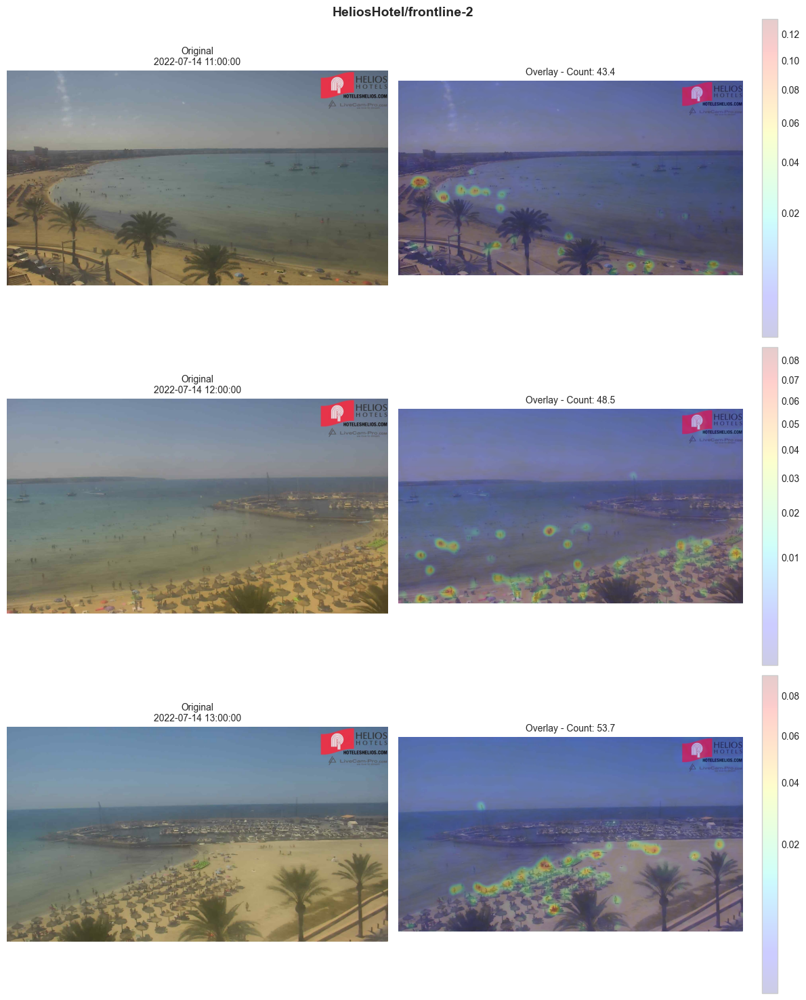


Camera: skyline/sant-antoni-de-portmany
Max in filtered data: 84


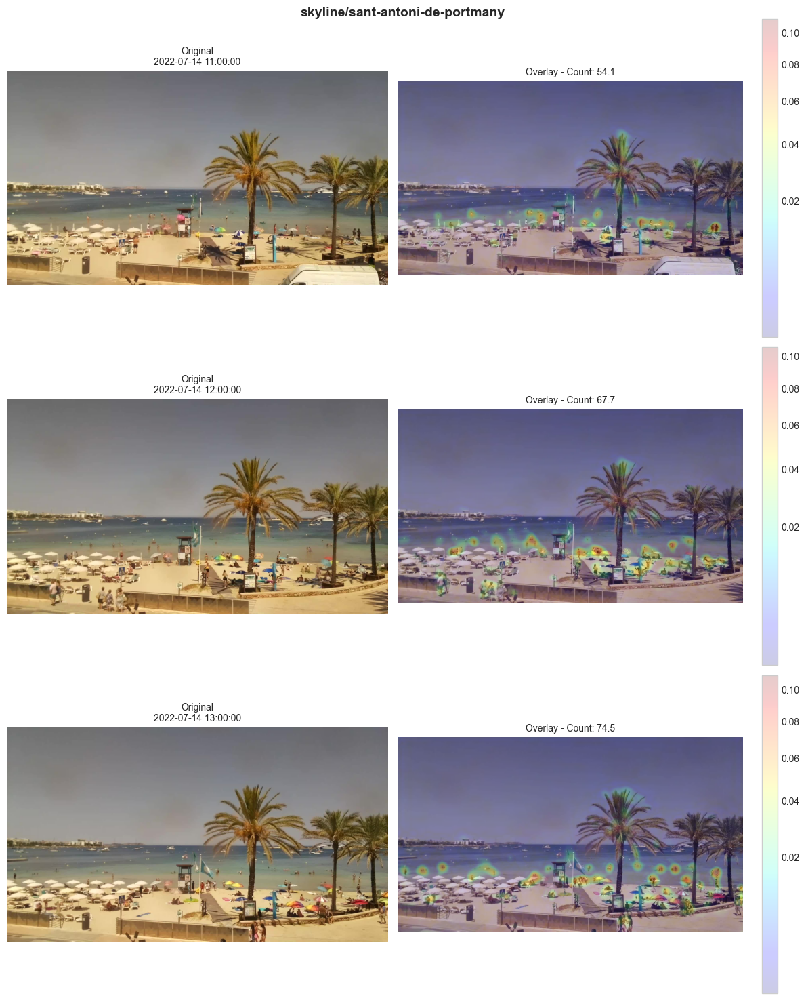


Camera: ipcamlive/MatiasBeach
Max in filtered data: 82


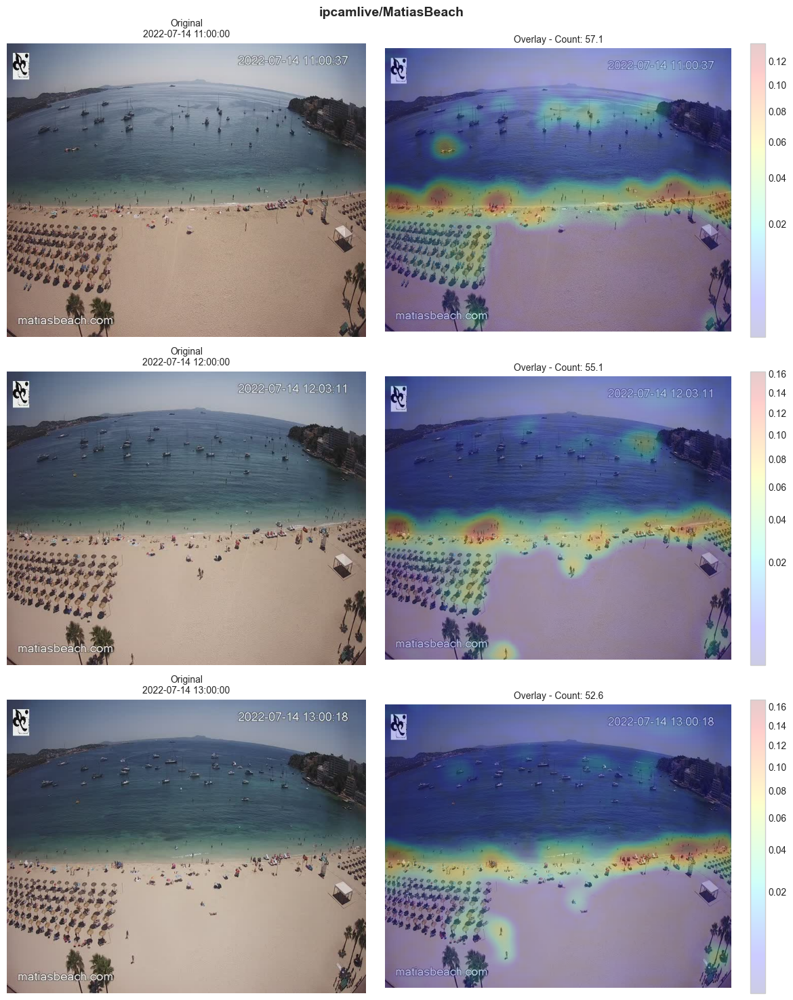


Camera: youtube/MET1lsmJMrQ
Max in filtered data: 73


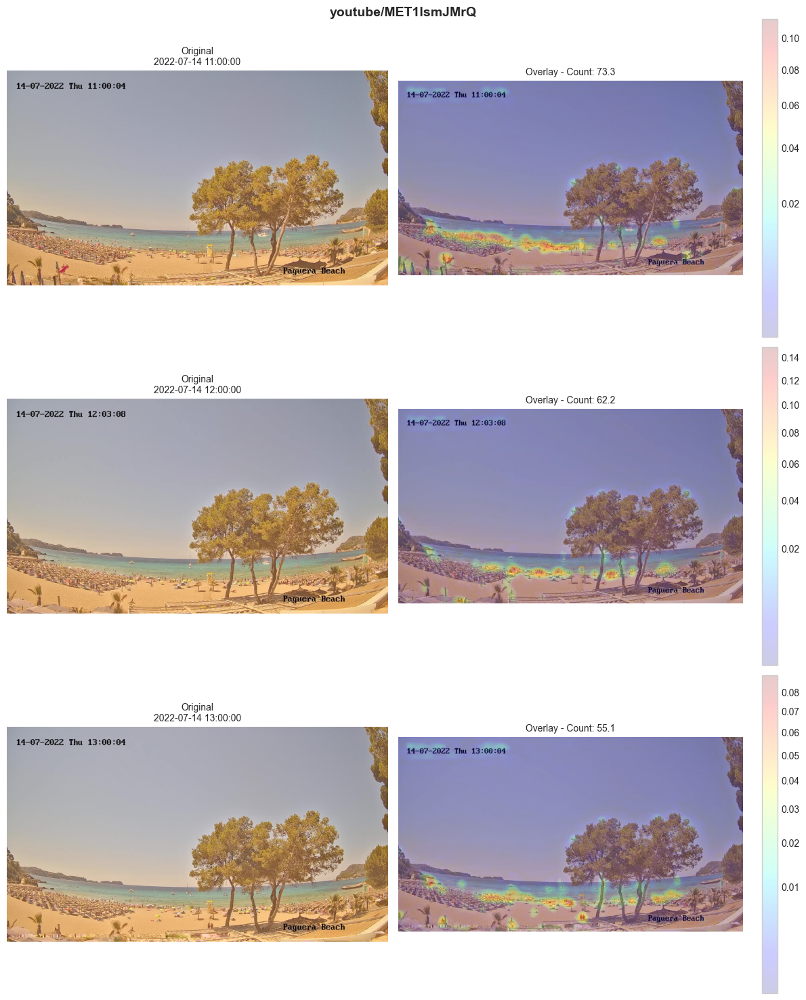


Camera: Monnaber/webcam-alcudia000M
Max in filtered data: 63


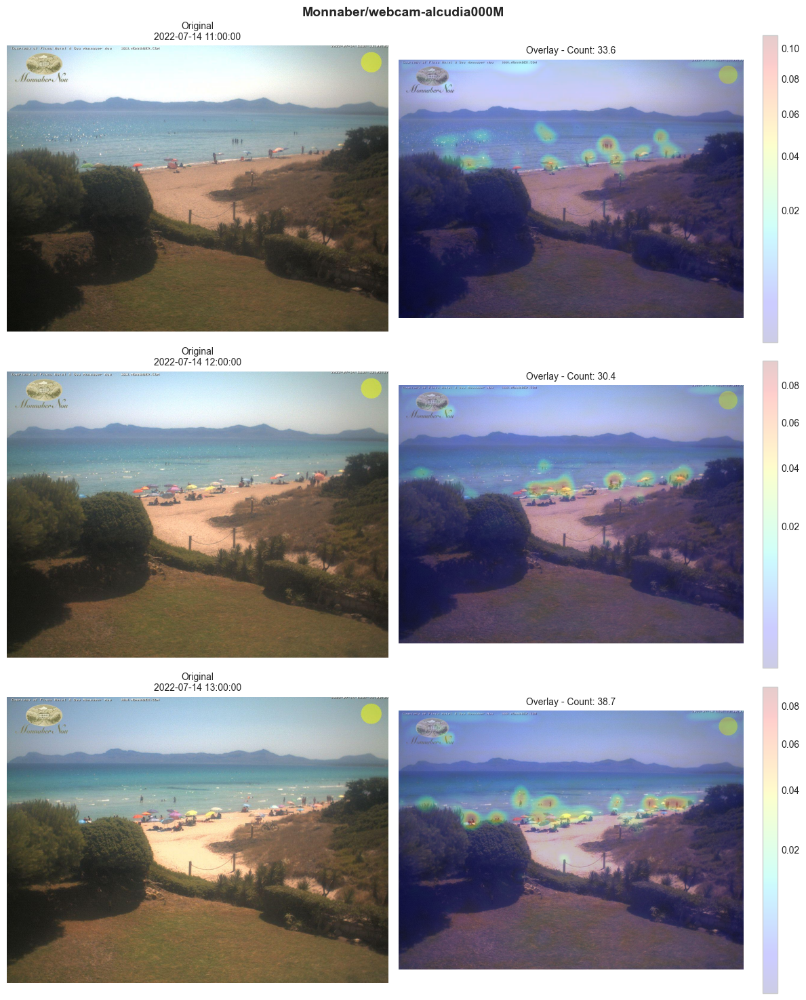


Camera: skyline/mallorca-alcudia
Max in filtered data: 46


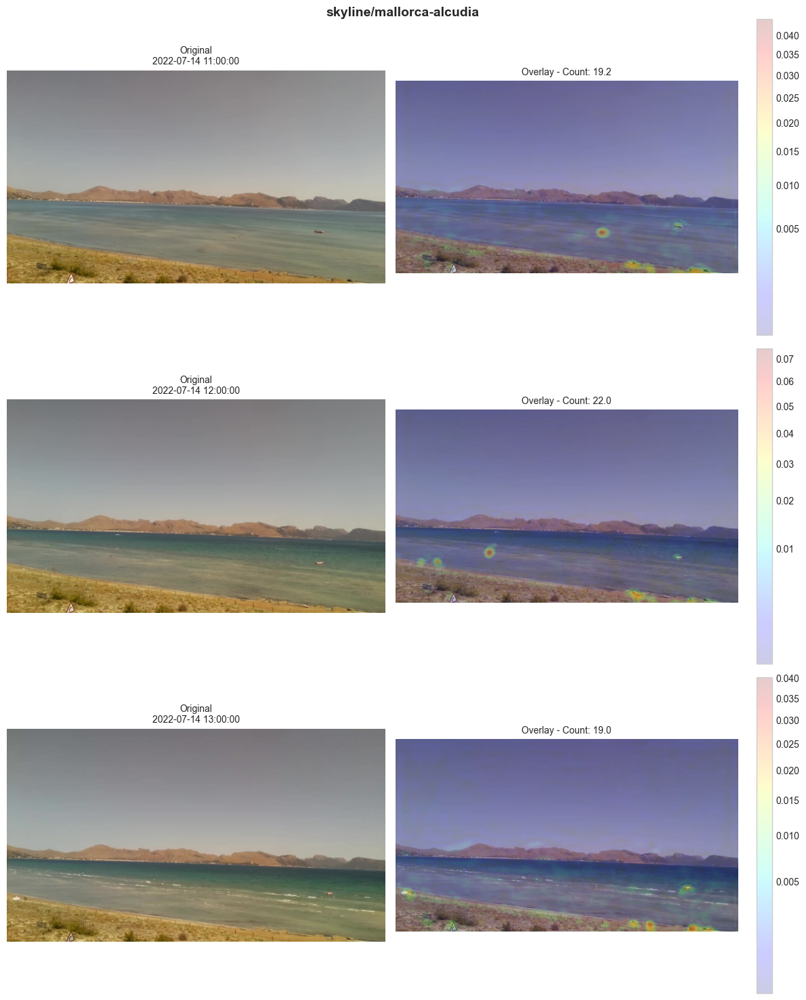


Camera: skyline/la-savina
Max in filtered data: 30


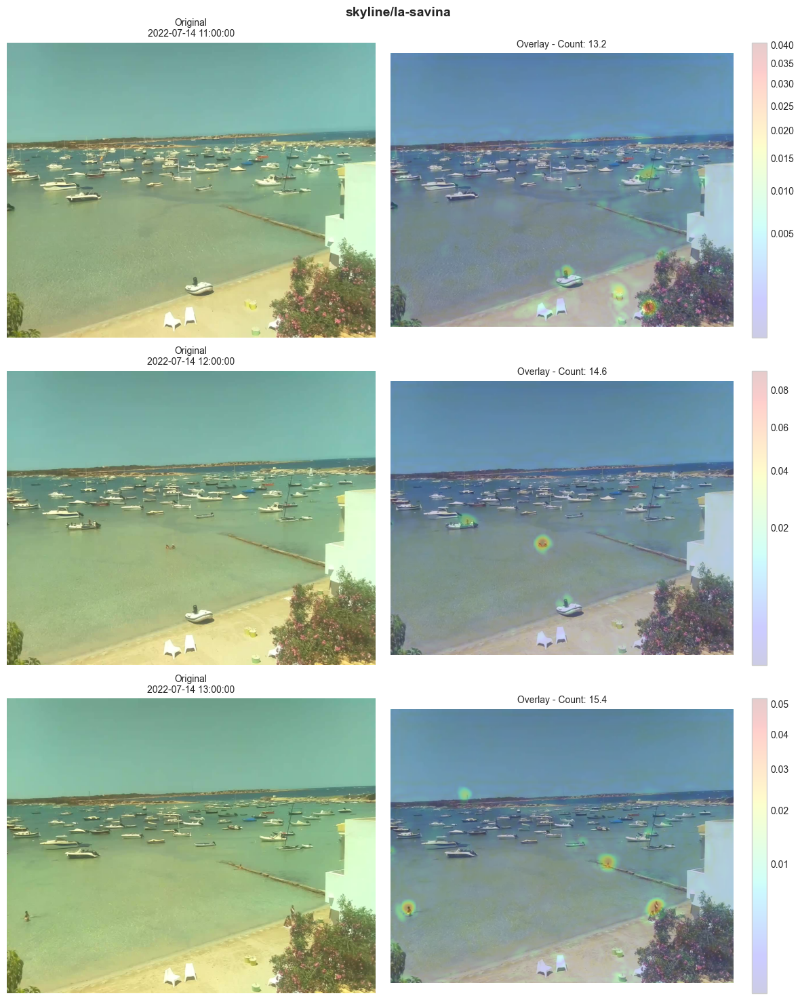

In [13]:
# Visualize density maps for low-count cameras (using FILTERED data)
if not HAS_MODEL:
    print("Skipping - crowd_module not available")
elif len(low_count_cameras) == 0:
    print("No low-count cameras after filtering!")
else:
    IMAGES_BASE_DIR = Path('/Users/guilhermemossibento/Desktop/master_activities/TFM/BeachCamDataset_NoVideos')
    
    for folder in low_count_cameras.index:
        folder_df = df[df['beach_folder'] == folder].head(3)
        
        if len(folder_df) == 0:
            print(f"\n{folder}: No images in filtered data")
            continue
        
        print(f"\n{'='*60}")
        print(f"Camera: {folder}")
        print(f"Max in filtered data: {low_count_cameras.loc[folder, 'max_count']:.0f}")
        print(f"{'='*60}")
        
        samples = []
        for _, row in folder_df.iterrows():
            filename = row.get('filename', '')
            if not filename:
                continue
            
            possible_paths = [
                IMAGES_BASE_DIR / folder / filename,
                IMAGES_BASE_DIR / folder.replace('_', '/') / filename,
            ]
            if '_' in folder:
                parts = folder.split('_', 1)
                possible_paths.append(IMAGES_BASE_DIR / parts[0] / parts[1] / filename)
            
            for p in possible_paths:
                if p.exists():
                    samples.append({'path': str(p), 'count': row['count'], 'datetime': str(row['datetime'])})
                    break
        
        if not samples:
            print(f"  No images found on disk")
            continue
        
        fig, axes = plt.subplots(len(samples), 2, figsize=(12, 5*len(samples)))
        if len(samples) == 1:
            axes = [axes]
        
        for idx, sample in enumerate(samples):
            try:
                count, density = predict_count_with_density(sample['path'])
                img = Image.open(sample['path'])
                img_array = np.array(img)
                
                # Left: Original image
                axes[idx][0].imshow(img_array)
                axes[idx][0].set_title(f"Original\n{sample['datetime']}", fontsize=10)
                axes[idx][0].axis('off')
                
                # Right: Image with density overlay
                from scipy.ndimage import zoom
                scale_h = img_array.shape[0] / density.shape[0]
                scale_w = img_array.shape[1] / density.shape[1]
                density_resized = zoom(density, (scale_h, scale_w), order=1)
                
                axes[idx][1].imshow(img_array)
                im = axes[idx][1].imshow(density_resized, cmap='jet', alpha=0.2,
                                         norm=mcolors.PowerNorm(gamma=0.5))
                axes[idx][1].set_title(f"Overlay - Count: {count:.1f}", fontsize=10)
                axes[idx][1].axis('off')
                plt.colorbar(im, ax=axes[idx][1], fraction=0.046)
                
                img.close()
            except Exception as e:
                print(f"  Error: {e}")
        
        plt.suptitle(f"{folder}", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

In [14]:
# Check columns
print("Columns:")
for col in df.columns:
    print(f"  {col}: {df[col].dtype}")

Columns:
  datetime: datetime64[ns]
  filename: object
  beach: object
  beach_folder: object
  lat: float64
  lon: float64
  count: float64
  ae_ta: float64
  ae_hr: float64
  ae_prec: float64
  ae_vv: float64
  ae_dv: float64
  ae_pres: float64
  ae_tamin: float64
  ae_tamax: float64
  ae_inso: float64
  ae_pres_nmar: float64
  ae_ts: float64
  om_temperature_2m: float64
  om_apparent_temperature: float64
  om_dewpoint_2m: float64
  om_relative_humidity_2m: float64
  om_pressure_msl: float64
  om_precipitation: float64
  om_rain: float64
  om_wind_speed_10m: float64
  om_wind_direction_10m: float64
  om_wind_gusts_10m: float64
  om_cloud_cover: float64
  om_cloud_cover_low: float64
  om_cloud_cover_mid: float64
  om_cloud_cover_high: float64
  om_sunshine_duration: float64
  om_vapour_pressure_deficit: float64
  om_direct_radiation: float64
  om_shortwave_radiation: float64


# 3 Data Exploration


In [15]:
# Records per beach
beach_counts = df['beach'].value_counts()
print("Records per beach:")
print(beach_counts)

Records per beach:
beach
Badia dAlcúdia                   156
Platja dor (Can Pastilla)        152
Port Pollença                     87
Platja Son Maties                 87
Port de Soller                    87
La Savina                         82
sant-antoni-de-portmany           78
Cala Vedella                      75
Can Pastilla                      22
Platja gran de Torà (Paguera)      7
Name: count, dtype: int64


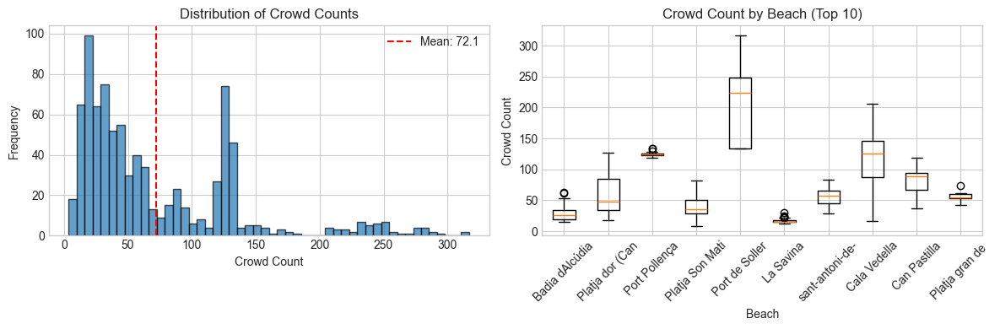


Count statistics:
count    850.000000
mean      72.078918
std       62.653908
min        3.719595
25%       25.835290
50%       47.247166
75%      121.710974
max      316.899078
Name: count, dtype: float64


In [16]:
# Target variable distribution
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(df['count'], bins=50, edgecolor='black', alpha=0.7)
axes[0].set_xlabel('Crowd Count')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Crowd Counts')
axes[0].axvline(df['count'].mean(), color='red', linestyle='--', label=f'Mean: {df["count"].mean():.1f}')
axes[0].legend()

axes[1].boxplot([df[df['beach'] == b]['count'].values for b in beach_counts.index[:10]], 
                labels=[b[:15] for b in beach_counts.index[:10]])
axes[1].set_xlabel('Beach')
axes[1].set_ylabel('Crowd Count')
axes[1].set_title('Crowd Count by Beach (Top 10)')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

print(f"\nCount statistics:")
print(df['count'].describe())

In [17]:
# Weather features overview
weather_cols = [c for c in df.columns if c.startswith('ae_') or c.startswith('om_')]
print(f"Weather features ({len(weather_cols)}):")
for col in weather_cols:
    if col in df.columns:
        print(f"  {col}: min={df[col].min():.1f}, max={df[col].max():.1f}, mean={df[col].mean():.1f}")

Weather features (29):
  ae_ta: min=27.0, max=36.4, mean=31.5
  ae_hr: min=34.6, max=78.9, mean=53.9
  ae_prec: min=0.0, max=0.0, mean=0.0
  ae_vv: min=0.7, max=7.1, mean=2.9
  ae_dv: min=9.2, max=344.3, mean=149.9
  ae_pres: min=1009.1, max=1018.8, mean=1014.2
  ae_tamin: min=24.7, max=35.8, mean=30.8
  ae_tamax: min=27.1, max=36.7, mean=32.0
  ae_inso: min=58.7, max=60.0, mean=60.0
  ae_pres_nmar: min=1013.7, max=1020.2, mean=1017.0
  ae_ts: min=32.3, max=44.4, mean=37.5
  om_temperature_2m: min=25.2, max=36.9, mean=30.9
  om_apparent_temperature: min=29.1, max=39.0, mean=33.9
  om_dewpoint_2m: min=11.3, max=24.4, mean=19.0
  om_relative_humidity_2m: min=21.7, max=88.0, mean=51.5
  om_pressure_msl: min=1013.8, max=1020.4, mean=1017.6
  om_precipitation: min=0.0, max=0.0, mean=0.0
  om_rain: min=0.0, max=0.0, mean=0.0
  om_wind_speed_10m: min=0.9, max=28.4, mean=10.9
  om_wind_direction_10m: min=8.3, max=353.0, mean=146.8
  om_wind_gusts_10m: min=7.7, max=54.4, mean=26.1
  om_cloud_co

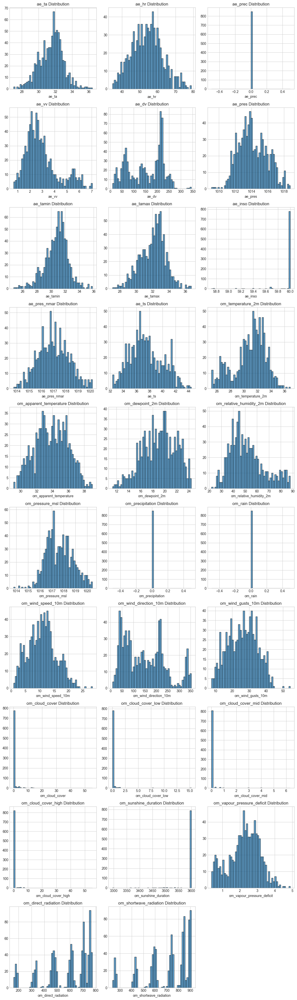

In [18]:
# Key weather variables distribution
key_weather = ['ae_ta', 'om_temperature_2m', 'ae_inso', 'om_wind_direction_10m', 
               'ae_hr', 'om_wind_speed_10m', 'om_apparent_temperature', 'ae_pres_nmar']
key_weather = [c for c in weather_cols if c in df.columns]

if key_weather:
    total_keys = len(key_weather)
    cols = 3
    rows = (total_keys + cols - 1) // cols  # Ceiling division
    
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axes = axes.flatten() if total_keys > 1 else [axes]
    
    for i, col in enumerate(key_weather):
        axes[i].hist(df[col].dropna(), bins=50, edgecolor='black', alpha=0.7)
        axes[i].set_xlabel(col)
        axes[i].set_title(f'{col} Distribution')
    
    # Hide empty subplots
    for j in range(len(key_weather), len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

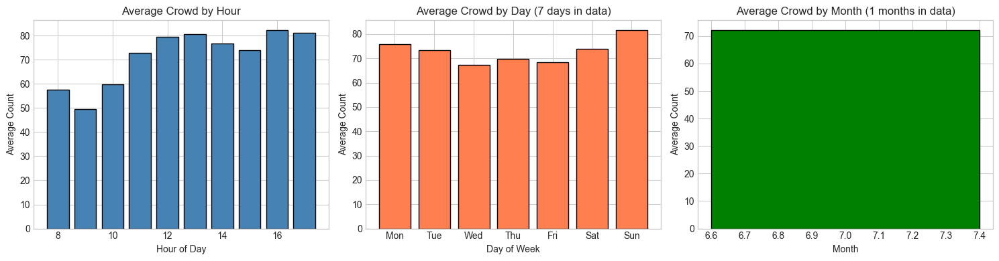


Data coverage:
  Hours: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
  Days: ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
  Months: [7]


In [19]:
# Temporal patterns
df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.dayofweek
df['month'] = df['datetime'].dt.month

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# By hour
hourly = df.groupby('hour')['count'].mean()
axes[0].bar(hourly.index, hourly.values, color='steelblue', edgecolor='black')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Average Count')
axes[0].set_title('Average Crowd by Hour')

# By day of week (handle missing days)
daily = df.groupby('day_of_week')['count'].mean()
days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
axes[1].bar([days[i] for i in daily.index], daily.values, color='coral', edgecolor='black')
axes[1].set_xlabel('Day of Week')
axes[1].set_ylabel('Average Count')
axes[1].set_title(f'Average Crowd by Day ({len(daily)} days in data)')

# By month (handle missing months)
monthly = df.groupby('month')['count'].mean()
axes[2].bar(monthly.index, monthly.values, color='green', edgecolor='black')
axes[2].set_xlabel('Month')
axes[2].set_ylabel('Average Count')
axes[2].set_title(f'Average Crowd by Month ({len(monthly)} months in data)')

plt.tight_layout()
plt.show()

print(f"\nData coverage:")
print(f"  Hours: {sorted(hourly.index.tolist())}")
print(f"  Days: {[days[i] for i in sorted(daily.index.tolist())]}")
print(f"  Months: {sorted(monthly.index.tolist())}")

Top correlations with crowd count:
om_wind_direction_10m         0.504815
om_apparent_temperature       0.407109
om_temperature_2m             0.337191
ae_hr                         0.325104
om_relative_humidity_2m      -0.274935
om_vapour_pressure_deficit    0.265259
ae_ta                        -0.255007
ae_tamax                     -0.252593
ae_pres                      -0.231315
om_wind_gusts_10m             0.178500
om_wind_speed_10m            -0.153215
ae_ts                         0.151378
ae_tamin                     -0.146818
om_direct_radiation           0.141384
om_pressure_msl               0.137164
Name: count, dtype: float64


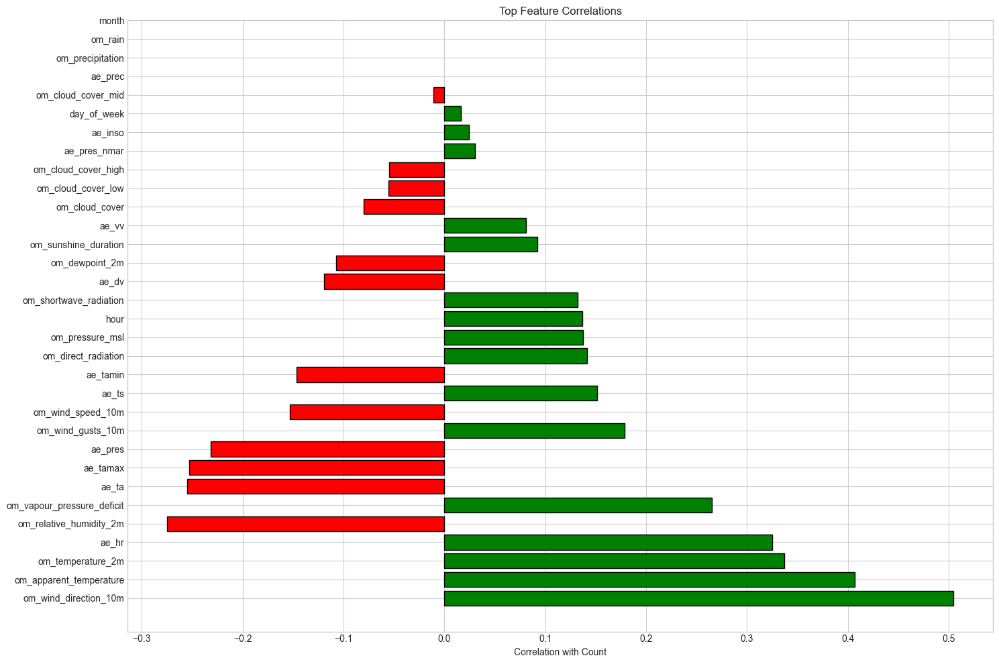

In [20]:
# Correlation with count
df_correlation = df.drop(columns=["lat", "lon", "datetime"])

numeric_cols = df_correlation.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [c for c in numeric_cols if c != 'count' and df_correlation[c].notna().sum() > 10]

correlations = df_correlation[numeric_cols + ['count']].corr()['count'].drop('count').sort_values(key=abs, ascending=False)

print("Top correlations with crowd count:")
print(correlations.head(15))

# Plot top correlations
top_corr = correlations
plt.figure(figsize=(15, 10))
colors = ['green' if x > 0 else 'red' for x in top_corr.values]
plt.barh(range(len(top_corr)), top_corr.values, color=colors, edgecolor='black')
plt.yticks(range(len(top_corr)), top_corr.index)
plt.xlabel('Correlation with Count')
plt.title('Top Feature Correlations')
plt.tight_layout()
plt.show()

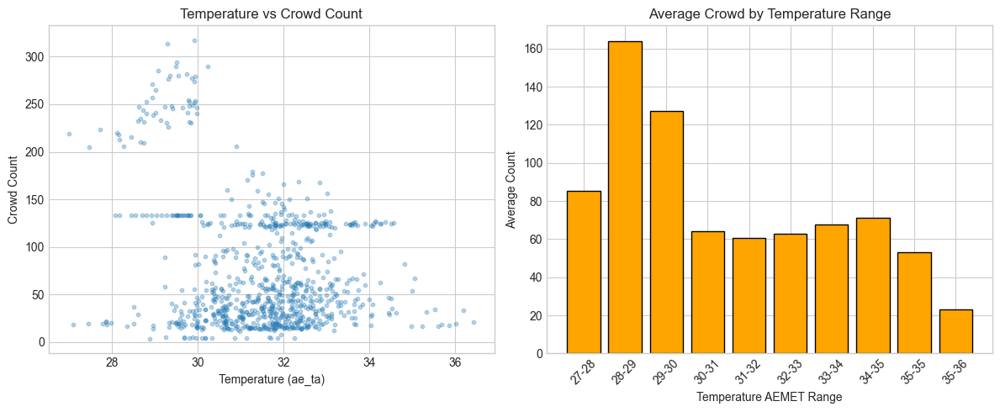

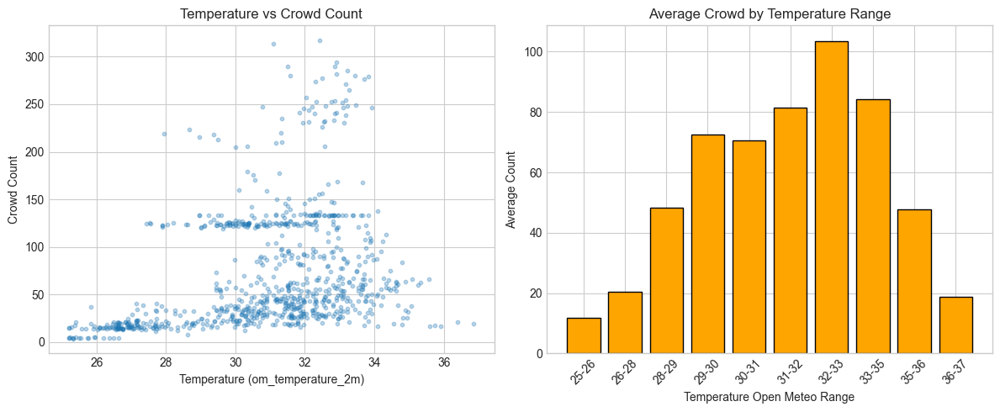

In [21]:
# Temperature vs Count scatter
temp_col = 'ae_ta' 

if temp_col in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    axes[0].scatter(df[temp_col], df['count'], alpha=0.3, s=10)
    axes[0].set_xlabel(f'Temperature ({temp_col})')
    axes[0].set_ylabel('Crowd Count')
    axes[0].set_title('Temperature vs Crowd Count')
    
    # Binned average
    df['temp_bin'] = pd.cut(df[temp_col], bins=10)
    temp_avg = df.groupby('temp_bin')['count'].mean()
    axes[1].bar(range(len(temp_avg)), temp_avg.values, color='orange', edgecolor='black')
    axes[1].set_xticks(range(len(temp_avg)))
    axes[1].set_xticklabels([f"{x.left:.0f}-{x.right:.0f}" for x in temp_avg.index], rotation=45)
    axes[1].set_xlabel('Temperature AEMET Range')
    axes[1].set_ylabel('Average Count')
    axes[1].set_title('Average Crowd by Temperature Range')
    
    plt.tight_layout()
    plt.show()

# Temperature vs Count scatter
temp_col = 'om_temperature_2m'

if temp_col in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    axes[0].scatter(df[temp_col], df['count'], alpha=0.3, s=10)
    axes[0].set_xlabel(f'Temperature ({temp_col})')
    axes[0].set_ylabel('Crowd Count')
    axes[0].set_title('Temperature vs Crowd Count')
    
    # Binned average
    df['temp_bin'] = pd.cut(df[temp_col], bins=10)
    temp_avg = df.groupby('temp_bin')['count'].mean()
    axes[1].bar(range(len(temp_avg)), temp_avg.values, color='orange', edgecolor='black')
    axes[1].set_xticks(range(len(temp_avg)))
    axes[1].set_xticklabels([f"{x.left:.0f}-{x.right:.0f}" for x in temp_avg.index], rotation=45)
    axes[1].set_xlabel('Temperature Open Meteo Range')
    axes[1].set_ylabel('Average Count')
    axes[1].set_title('Average Crowd by Temperature Range')
    
    plt.tight_layout()
    plt.show()

---
## 3. Feature Engineering

In [57]:
def add_features(df):
    """Add temporal and cyclical features."""
    df = df.copy()
    
    # Temporal
    df['hour'] = df['datetime'].dt.hour
    df['day_of_week'] = df['datetime'].dt.dayofweek
    df['day_of_year'] = df['datetime'].dt.dayofyear
    df['month'] = df['datetime'].dt.month
    df['is_weekend'] = (df['day_of_week'] >= 5).astype(int)

    # Month × Weather interactions
    df['temp_x_summer'] = df['om_temperature_2m'] * (df['month'].isin([6,7,8])).astype(int)
    df['temp_x_winter'] = df['om_temperature_2m'] * (df['month'].isin([12,1,2])).astype(int)
    
    # Weekend × Season
    df['weekend_x_summer'] = df['is_weekend'] * (df['month'].isin([6,7,8])).astype(int)
    
    # Hour × Season (peak hours shift by season)
    df['hour_x_summer'] = df['hour'] * (df['month'].isin([6,7,8])).astype(int)
    
    return df

df = add_features(df)
print(f"Dataset shape after features: {df.shape}")

Dataset shape after features: (850, 46)


In [58]:
# Define feature sets - NO LOCATION FEATURES
WEATHER_FEATURES = [c for c in df.columns if c.startswith('ae_') or c.startswith('om_')]
TEMPORAL_FEATURES = ['hour', 'day_of_week', 'month', 'is_weekend', 'temp_x_summer', 'temp_x_winter', 'weekend_x_summer', 'hour_x_summer']

print(f"Weather features: {len(WEATHER_FEATURES)}")
print(f"Temporal features: {len(TEMPORAL_FEATURES)}")

print("\n⚠️ NOT using location features (coordinates or beach name)")
print("   Model learns general patterns: weather + time → crowd count")
print("   Validation still uses per-beach MAX for fair comparison")

Weather features: 29
Temporal features: 8

⚠️ NOT using location features (coordinates or beach name)
   Model learns general patterns: weather + time → crowd count
   Validation still uses per-beach MAX for fair comparison


In [59]:
# Select features for training - WEATHER + TEMPORAL only
def get_features(df, include_weather=True, include_temporal=True):
    features = []
    if include_weather:
        features.extend([c for c in WEATHER_FEATURES if c in df.columns])
    if include_temporal:
        features.extend([c for c in TEMPORAL_FEATURES if c in df.columns])
    return features

feature_cols = get_features(df, include_weather=True, include_temporal=True)
print(f"Total features: {len(feature_cols)}")
print(f"\nFeatures: {feature_cols}")

Total features: 37

Features: ['ae_ta', 'ae_hr', 'ae_prec', 'ae_vv', 'ae_dv', 'ae_pres', 'ae_tamin', 'ae_tamax', 'ae_inso', 'ae_pres_nmar', 'ae_ts', 'om_temperature_2m', 'om_apparent_temperature', 'om_dewpoint_2m', 'om_relative_humidity_2m', 'om_pressure_msl', 'om_precipitation', 'om_rain', 'om_wind_speed_10m', 'om_wind_direction_10m', 'om_wind_gusts_10m', 'om_cloud_cover', 'om_cloud_cover_low', 'om_cloud_cover_mid', 'om_cloud_cover_high', 'om_sunshine_duration', 'om_vapour_pressure_deficit', 'om_direct_radiation', 'om_shortwave_radiation', 'hour', 'day_of_week', 'month', 'is_weekend', 'temp_x_summer', 'temp_x_winter', 'weekend_x_summer', 'hour_x_summer']


In [60]:
# Prepare X and y
df_clean = df.dropna(subset=feature_cols + ['count'])


In [61]:
# Calculate MAX per beach (each beach's capacity)
beach_col = 'beach' if 'beach' in df_clean.columns else 'beach_folder'
beach_max = df_clean.groupby(beach_col)['count'].max().to_dict()

print("Beach capacities (max observed count):")
for beach, max_val in sorted(beach_max.items(), key=lambda x: -x[1]):
    print(f"  {beach[:30]:30s}: {max_val:.0f}")
print(f"\nTotal beaches: {len(beach_max)}")
print(f"Average beach capacity: {sum(beach_max.values())/len(beach_max):.1f}")

Beach capacities (max observed count):
  Port de Soller                : 317
  Cala Vedella                  : 206
  Port Pollença                 : 133
  Platja dor (Can Pastilla)     : 127
  Can Pastilla                  : 118
  sant-antoni-de-portmany       : 84
  Platja Son Maties             : 82
  Platja gran de Torà (Paguera) : 73
  Badia dAlcúdia                : 63
  La Savina                     : 30

Total beaches: 10
Average beach capacity: 123.2


In [62]:
# Filter beaches with more than 20 max

threshold = 20
print(df_clean.shape)
good_beaches = [b for b, m in beach_max.items() if m > threshold]
df_clean = df_clean[df_clean[beach_col].isin(good_beaches)].copy().reset_index(drop=True)
print(df_clean.shape)



(850, 46)
(833, 46)


In [63]:

X = df_clean[feature_cols]
y = df_clean['count']

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")
print(f"y range: {y.min():.1f} to {y.max():.1f}")

X shape: (833, 37)
y shape: (833,)
y range: 8.2 to 316.9


---
## 4. Model Training & Comparison

In [64]:
# Train/test split (time-based)
split_idx = int(len(X) * 0.8)

X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

print(f"Train: {len(X_train)} samples ({df_clean.iloc[:split_idx]['datetime'].min()} to {df_clean.iloc[:split_idx]['datetime'].max()})")
print(f"Test:  {len(X_test)} samples ({df_clean.iloc[split_idx:]['datetime'].min()} to {df_clean.iloc[split_idx:]['datetime'].max()})")

Train: 666 samples (2022-07-14 11:00:00 to 2022-07-21 13:00:00)
Test:  167 samples (2022-07-21 13:00:00 to 2022-07-25 17:00:00)


In [65]:
# =============================================================================
# LSTM MODEL
# =============================================================================

class LSTMRegressor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, dropout=0.2):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0
        )
        self.fc = nn.Linear(hidden_size, 1)
    
    def forward(self, x):
        # x: (batch, seq_len, features) or (batch, features)
        if x.dim() == 2:
            x = x.unsqueeze(1)  # Add seq dimension
        
        lstm_out, _ = self.lstm(x)
        out = self.fc(lstm_out[:, -1, :])  # Last timestep
        return out.squeeze(-1)


class LSTMWrapper:
    """Sklearn-compatible wrapper for LSTM."""
    
    def __init__(self, input_size=None, hidden_size=64, num_layers=2, 
                 epochs=100, lr=0.001, batch_size=32, patience=10):
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.epochs = epochs
        self.lr = lr
        self.batch_size = batch_size
        self.patience = patience
        self.model = None
        self.scaler_X = StandardScaler()
        self.scaler_y = StandardScaler()
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    def fit(self, X, y):
        X = np.array(X)
        y = np.array(y).reshape(-1, 1)
        
        # Scale
        X_scaled = self.scaler_X.fit_transform(X)
        y_scaled = self.scaler_y.fit_transform(y).flatten()
        
        # To tensors
        X_t = torch.FloatTensor(X_scaled).to(self.device)
        y_t = torch.FloatTensor(y_scaled).to(self.device)
        
        # Model
        self.input_size = X.shape[1]
        self.model = LSTMRegressor(self.input_size, self.hidden_size, self.num_layers).to(self.device)
        
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr)
        criterion = nn.MSELoss()
        
        dataset = TensorDataset(X_t, y_t)
        loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=True)
        
        best_loss = float('inf')
        patience_counter = 0
        
        self.model.train()
        for epoch in range(self.epochs):
            epoch_loss = 0
            for batch_X, batch_y in loader:
                optimizer.zero_grad()
                pred = self.model(batch_X)
                loss = criterion(pred, batch_y)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
            
            avg_loss = epoch_loss / len(loader)
            if avg_loss < best_loss:
                best_loss = avg_loss
                patience_counter = 0
                self.best_state = copy.deepcopy(self.model.state_dict())
            else:
                patience_counter += 1
                if patience_counter >= self.patience:
                    break
        
        self.model.load_state_dict(self.best_state)
        return self
    
    def predict(self, X):
        X = np.array(X)
        X_scaled = self.scaler_X.transform(X)
        X_t = torch.FloatTensor(X_scaled).to(self.device)
        
        self.model.eval()
        with torch.no_grad():
            pred_scaled = self.model(X_t).cpu().numpy()
        
        pred = self.scaler_y.inverse_transform(pred_scaled.reshape(-1, 1)).flatten()
        return pred

print("LSTM model defined")
print(f"  Device: {torch.device('cuda' if torch.cuda.is_available() else 'cpu')}")

LSTM model defined
  Device: cpu


In [82]:
# Define models to compare
models = {
    'Lasso': Lasso(alpha=0.1),
    'RandomForest': RandomForestRegressor(n_estimators=10000, random_state=42, n_jobs=-1),
    'GradientBoosting': GradientBoostingRegressor(n_estimators=10000, random_state=42),
    'LSTM': LSTMWrapper(hidden_size=64, num_layers=4, epochs=10000, lr=0.001, patience=15),
}

if HAS_XGB:
    models['XGBoost'] = XGBRegressor(n_estimators=1000, random_state=42, n_jobs=-1, verbosity=0)

print(f"Models to compare: {list(models.keys())}")

Models to compare: ['Lasso', 'RandomForest', 'GradientBoosting', 'LSTM', 'XGBoost']


In [83]:
# Train and evaluate all models
results = []

for name, model in models.items():
    print(f"Training {name}...", end=" ")
    
    model.fit(X_train, y_train)
    
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Evaluate per-beach, get average
    test_df_temp = df_clean.iloc[split_idx:].copy()
    beach_df, avg_metrics = evaluate_model(test_df_temp, y_pred_test, beach_col)
    
    # Absolute metrics (for reference)
    test_rmse = np.sqrt(np.mean((y_test - y_pred_test)**2))
    test_mae = np.mean(np.abs(y_test - y_pred_test))
    test_r2 = 1 - np.sum((y_test - y_pred_test)**2) / np.sum((y_test - y_test.mean())**2)
    
    results.append({
        'Model': name,
        'Test MAE': test_mae,
        'Test RMSE': test_rmse,
        'Test R²': test_r2,
        'Avg MAE/Max (%)': avg_metrics['Avg MAE/Max (%)'],
        'Avg MRE (%)': avg_metrics['Avg MRE (%)'],
    })
    
    print(f"MAE: {test_mae:.2f}, Avg MAE/Max: {avg_metrics['Avg MAE/Max (%)']:.1f}%, Avg MRE: {avg_metrics['Avg MRE (%)']:.1f}%")

results_df = pd.DataFrame(results).sort_values('Avg MRE (%)')
print("\n" + "="*90)
print("MODEL COMPARISON (average of per-beach relative error)")
print("="*90)
print(results_df.to_string(index=False))

Training Lasso... MAE: 33.56, Avg MAE/Max: 35.8%, Avg MRE: 35.8%
Training RandomForest... MAE: 26.52, Avg MAE/Max: 27.2%, Avg MRE: 27.2%
Training GradientBoosting... MAE: 28.18, Avg MAE/Max: 33.3%, Avg MRE: 33.3%
Training LSTM... MAE: 19.59, Avg MAE/Max: 18.6%, Avg MRE: 18.6%
Training XGBoost... MAE: 29.79, Avg MAE/Max: 32.5%, Avg MRE: 32.5%

MODEL COMPARISON (average of per-beach relative error)
           Model  Test MAE  Test RMSE  Test R²  Avg MAE/Max (%)  Avg MRE (%)
            LSTM 19.589829  30.031636 0.642719        18.629454    18.629454
    RandomForest 26.520228  32.315895 0.586301        27.177959    27.177959
         XGBoost 29.786482  40.269296 0.357608        32.502258    32.502258
GradientBoosting 28.182141  34.616971 0.525288        33.273446    33.273446
           Lasso 33.562248  40.889208 0.337678        35.776383    35.776383


In [86]:
# Install Optuna (run once)
subprocess.check_call([sys.executable, "-m", "pip", "install", "optuna", "-q"])

import optuna
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Time series cross-validation (respects temporal order)
tscv = TimeSeriesSplit(n_splits=5)

def objective_lasso(trial):
    params = {
        'alpha': trial.suggest_float('alpha', 0.0001, 10.0, log=True),
    }
    model = Lasso(**params)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
    return -scores.mean()

def objective_rf(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
        'random_state': 42,
        'n_jobs': -1
    }
    model = RandomForestRegressor(**params)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
    return -scores.mean()

def objective_gb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'random_state': 42
    }
    model = GradientBoostingRegressor(**params)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
    return -scores.mean()

def objective_xgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
        'random_state': 42,
        'n_jobs': -1,
        'verbosity': 0
    }
    model = XGBRegressor(**params)
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
    return -scores.mean()

# Run optimization
N_TRIALS = 100  # Number of parameter combinations to try

print("=" * 70)
print(f"HYPERPARAMETER OPTIMIZATION ({N_TRIALS} trials per model)")
print("=" * 70)

best_params = {}
optimization_results = []

# Lasso
print("\n[1/4] Optimizing Lasso...")
study = optuna.create_study(direction='minimize')
study.optimize(objective_lasso, n_trials=N_TRIALS, show_progress_bar=True)
best_params['Lasso'] = study.best_params
optimization_results.append({'Model': 'Lasso', 'Best MAE': study.best_value, 'Params': study.best_params})
print(f"  Best MAE: {study.best_value:.2f} | Params: {study.best_params}")

# Random Forest
print("\n[2/4] Optimizing RandomForest...")
study = optuna.create_study(direction='minimize')
study.optimize(objective_rf, n_trials=N_TRIALS, show_progress_bar=True)
best_params['RandomForest'] = study.best_params
optimization_results.append({'Model': 'RandomForest', 'Best MAE': study.best_value, 'Params': study.best_params})
print(f"  Best MAE: {study.best_value:.2f} | Params: {study.best_params}")

# Gradient Boosting
print("\n[3/4] Optimizing GradientBoosting...")
study = optuna.create_study(direction='minimize')
study.optimize(objective_gb, n_trials=N_TRIALS, show_progress_bar=True)
best_params['GradientBoosting'] = study.best_params
optimization_results.append({'Model': 'GradientBoosting', 'Best MAE': study.best_value, 'Params': study.best_params})
print(f"  Best MAE: {study.best_value:.2f} | Params: {study.best_params}")

# XGBoost
if HAS_XGB:
    print("\n[4/4] Optimizing XGBoost...")
    study = optuna.create_study(direction='minimize')
    study.optimize(objective_xgb, n_trials=N_TRIALS, show_progress_bar=True)
    best_params['XGBoost'] = study.best_params
    optimization_results.append({'Model': 'XGBoost', 'Best MAE': study.best_value, 'Params': study.best_params})
    print(f"  Best MAE: {study.best_value:.2f} | Params: {study.best_params}")

# Summary
print("\n" + "=" * 70)
print("OPTIMIZATION RESULTS (ranked by CV MAE)")
print("=" * 70)
opt_df = pd.DataFrame(optimization_results).sort_values('Best MAE')
for _, row in opt_df.iterrows():
    print(f"\n{row['Model']}:")
    print(f"  CV MAE: {row['Best MAE']:.2f}")
    print(f"  Params: {row['Params']}")

HYPERPARAMETER OPTIMIZATION (100 trials per model)

[1/4] Optimizing Lasso...



[notice] A new release of pip is available: 24.3.1 -> 26.0
[notice] To update, run: pip3.13 install --upgrade pip


  0%|          | 0/100 [00:00<?, ?it/s]

  Best MAE: 36.93 | Params: {'alpha': 9.884909471362283}

[2/4] Optimizing RandomForest...


  0%|          | 0/100 [00:00<?, ?it/s]

  Best MAE: 30.28 | Params: {'n_estimators': 193, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': None}

[3/4] Optimizing GradientBoosting...


  0%|          | 0/100 [00:00<?, ?it/s]

  Best MAE: 29.10 | Params: {'n_estimators': 401, 'max_depth': 10, 'learning_rate': 0.022086985461707412, 'min_samples_split': 7, 'min_samples_leaf': 2, 'subsample': 0.7320817880903051}

[4/4] Optimizing XGBoost...


  0%|          | 0/100 [00:00<?, ?it/s]

  Best MAE: 30.29 | Params: {'n_estimators': 358, 'max_depth': 5, 'learning_rate': 0.09607309932210376, 'subsample': 0.8392100879165061, 'colsample_bytree': 0.7677507049173344, 'reg_alpha': 0.24835200898244358, 'reg_lambda': 1.1746599713300232}

OPTIMIZATION RESULTS (ranked by CV MAE)

GradientBoosting:
  CV MAE: 29.10
  Params: {'n_estimators': 401, 'max_depth': 10, 'learning_rate': 0.022086985461707412, 'min_samples_split': 7, 'min_samples_leaf': 2, 'subsample': 0.7320817880903051}

RandomForest:
  CV MAE: 30.28
  Params: {'n_estimators': 193, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': None}

XGBoost:
  CV MAE: 30.29
  Params: {'n_estimators': 358, 'max_depth': 5, 'learning_rate': 0.09607309932210376, 'subsample': 0.8392100879165061, 'colsample_bytree': 0.7677507049173344, 'reg_alpha': 0.24835200898244358, 'reg_lambda': 1.1746599713300232}

Lasso:
  CV MAE: 36.93
  Params: {'alpha': 9.884909471362283}


In [87]:
# Create models with OPTIMIZED parameters
print("\n" + "=" * 70)
print("TRAINING WITH OPTIMIZED PARAMETERS")
print("=" * 70)

models_optimized = {
    'Lasso': Lasso(**best_params['Lasso']),
    'RandomForest': RandomForestRegressor(**best_params['RandomForest'], random_state=42, n_jobs=-1),
    'GradientBoosting': GradientBoostingRegressor(**best_params['GradientBoosting'], random_state=42),
}
if HAS_XGB:
    models_optimized['XGBoost'] = XGBRegressor(**best_params['XGBoost'], random_state=42, n_jobs=-1, verbosity=0)

# Train and evaluate
results_optimized = []
for name, model in models_optimized.items():
    print(f"Training {name}...", end=" ")
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    
    test_df_temp = df_clean.iloc[split_idx:].copy()
    beach_df, avg_metrics = evaluate_model(test_df_temp, y_pred_test, beach_col)
    
    test_mae = np.mean(np.abs(y_test - y_pred_test))
    test_r2 = 1 - np.sum((y_test - y_pred_test)**2) / np.sum((y_test - y_test.mean())**2)
    
    results_optimized.append({
        'Model': name,
        'Test MAE': test_mae,
        'Test R²': test_r2,
        'Avg MAE/Max (%)': avg_metrics['Avg MAE/Max (%)'],
        'Avg MRE (%)': avg_metrics['Avg MRE (%)'],
    })
    print(f"MAE: {test_mae:.2f}, MRE: {avg_metrics['Avg MRE (%)']:.1f}%")

results_opt_df = pd.DataFrame(results_optimized).sort_values('Avg MRE (%)')
print("\n" + "=" * 70)
print("OPTIMIZED MODEL COMPARISON")
print("=" * 70)
print(results_opt_df.to_string(index=False))


TRAINING WITH OPTIMIZED PARAMETERS
Training Lasso... MAE: 37.93, MRE: 43.8%
Training RandomForest... MAE: 26.63, MRE: 27.3%
Training GradientBoosting... MAE: 25.71, MRE: 27.3%
Training XGBoost... MAE: 27.22, MRE: 29.8%

OPTIMIZED MODEL COMPARISON
           Model  Test MAE  Test R²  Avg MAE/Max (%)  Avg MRE (%)
GradientBoosting 25.711772 0.580204        27.251173    27.251173
    RandomForest 26.631762 0.588797        27.285093    27.285093
         XGBoost 27.224857 0.531096        29.799604    29.799604
           Lasso 37.929406 0.208184        43.848041    43.848041


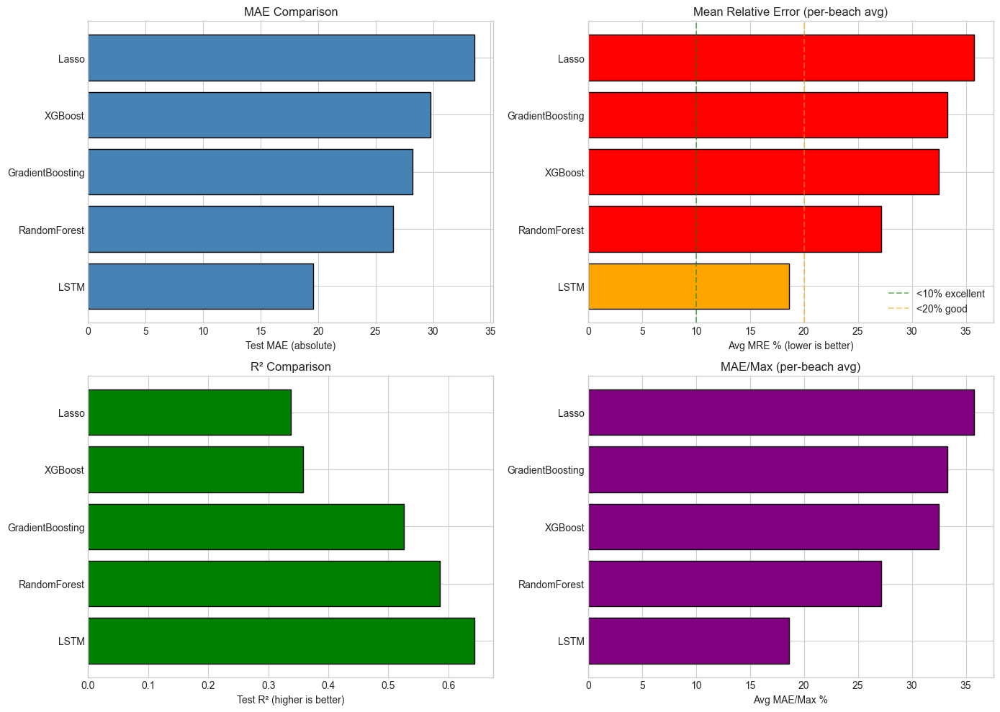


BEST MODEL: LSTM
  Avg MRE: 18.6%
  Avg MAE/Max: 18.6%
  Test R²: 0.643


In [89]:
# Visualize model comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. MAE (absolute)
ax = axes[0, 0]
sorted_by_mae = results_df.sort_values('Test MAE')
ax.barh(sorted_by_mae['Model'], sorted_by_mae['Test MAE'], color='steelblue', edgecolor='black')
ax.set_xlabel('Test MAE (absolute)')
ax.set_title('MAE Comparison')

# 2. Avg MRE (per-beach average relative error)
ax = axes[0, 1]
sorted_df = results_df.sort_values('Avg MRE (%)')
colors = ['green' if x < 10 else 'orange' if x < 20 else 'red' for x in sorted_df['Avg MRE (%)']]
ax.barh(sorted_df['Model'], sorted_df['Avg MRE (%)'], color=colors, edgecolor='black')
ax.set_xlabel('Avg MRE % (lower is better)')
ax.set_title('Mean Relative Error (per-beach avg)')
ax.axvline(10, color='green', linestyle='--', alpha=0.5, label='<10% excellent')
ax.axvline(20, color='orange', linestyle='--', alpha=0.5, label='<20% good')
ax.legend()

# 3. R²
ax = axes[1, 0]
sorted_by_r2 = results_df.sort_values('Test R²', ascending=False)
colors_r2 = ['green' if x > 0 else 'red' for x in sorted_by_r2['Test R²']]
ax.barh(sorted_by_r2['Model'], sorted_by_r2['Test R²'], color=colors_r2, edgecolor='black')
ax.set_xlabel('Test R² (higher is better)')
ax.set_title('R² Comparison')
ax.axvline(0, color='red', linestyle='--', alpha=0.5)

# 4. Avg MAE/Max
ax = axes[1, 1]
sorted_df = results_df.sort_values('Avg MAE/Max (%)')
ax.barh(sorted_df['Model'], sorted_df['Avg MAE/Max (%)'], color='purple', edgecolor='black')
ax.set_xlabel('Avg MAE/Max %')
ax.set_title('MAE/Max (per-beach avg)')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("BEST MODEL:", results_df.iloc[0]['Model'])
print(f"  Avg MRE: {results_df.iloc[0]['Avg MRE (%)']:.1f}%")
print(f"  Avg MAE/Max: {results_df.iloc[0]['Avg MAE/Max (%)']:.1f}%")
print(f"  Test R²: {results_df.iloc[0]['Test R²']:.3f}")
print("="*60)

---
## 5. Feature Importance Analysis

In [69]:
# =============================================================================
# FEATURE IMPORTANCE FOR ALL MODELS
# =============================================================================

def get_feature_importance(model, feature_cols):
    """Extract normalized feature importance from any model."""
    if hasattr(model, 'feature_importances_'):
        # Tree-based models
        imp = model.feature_importances_
    elif hasattr(model, 'coef_'):
        # Linear models - use absolute coefficients
        imp = np.abs(model.coef_)
    else:
        return None
    
    # Normalize to sum to 1
    if imp.sum() > 0:
        imp = imp / imp.sum()
    return pd.Series(imp, index=feature_cols)

# Get importance for all models
all_importance = {}
for name, model in models.items():
    imp = get_feature_importance(model, feature_cols)
    if imp is not None:
        all_importance[name] = imp

# Create DataFrame
importance_df = pd.DataFrame(all_importance)

# Add average importance across models
importance_df['AVG'] = importance_df.mean(axis=1)
importance_df = importance_df.sort_values('AVG', ascending=False)

print("="*100)
print("FEATURE IMPORTANCE BY MODEL (normalized, higher = more important)")
print("="*100)
print((importance_df * 100).round(1).head(15).to_string())
print("\n... (showing top 15 features)")

FEATURE IMPORTANCE BY MODEL (normalized, higher = more important)
                         Lasso  RandomForest  GradientBoosting    XGBoost   AVG
om_wind_direction_10m      0.1          45.7              48.3  50.299999  36.1
om_pressure_msl           26.8           1.6               4.2   1.800000   8.6
ae_pres                   16.6           2.9               4.1   1.800000   6.3
ae_hr                      0.5           9.1               8.4   4.600000   5.7
ae_vv                     13.1           3.7               2.9   2.500000   5.5
om_wind_speed_10m          6.8           2.4               2.7   2.600000   3.6
ae_pres_nmar              10.0           0.9               0.8   0.800000   3.1
om_temperature_2m          0.0           3.7               2.1   5.600000   2.9
ae_ta                      0.9           4.5               4.2   1.800000   2.8
ae_tamax                   1.6           3.5               3.7   2.200000   2.8
is_weekend                10.9           0.1          

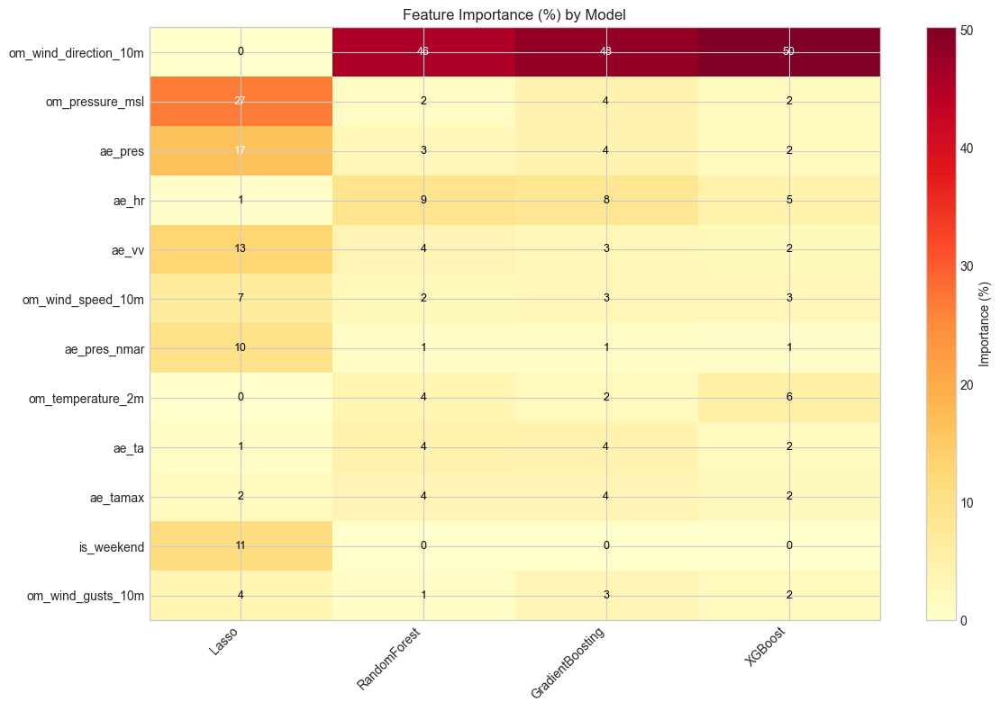

In [70]:
# Heatmap of feature importance across models
top_features = importance_df.head(12).drop(columns='AVG')

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(top_features.values * 100, cmap='YlOrRd', aspect='auto')

ax.set_xticks(range(len(top_features.columns)))
ax.set_xticklabels(top_features.columns, rotation=45, ha='right')
ax.set_yticks(range(len(top_features.index)))
ax.set_yticklabels(top_features.index)
ax.set_title('Feature Importance (%) by Model')

# Add text annotations
for i in range(len(top_features.index)):
    for j in range(len(top_features.columns)):
        val = top_features.iloc[i, j] * 100
        color = 'white' if val > 15 else 'black'
        ax.text(j, i, f'{val:.0f}', ha='center', va='center', fontsize=9, color=color)

plt.colorbar(im, ax=ax, label='Importance (%)')
plt.tight_layout()
plt.show()

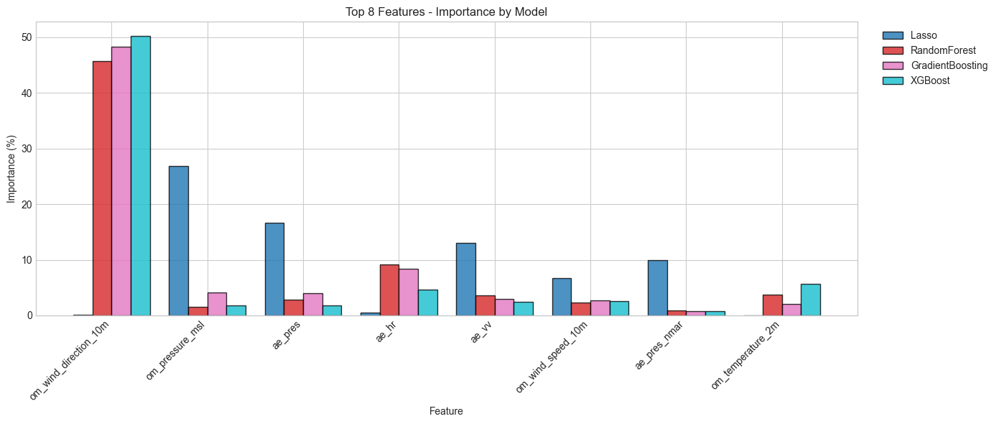

In [71]:
# Grouped bar chart - top features across models
top_n = 8
top_feat_df = importance_df.head(top_n).drop(columns='AVG')

fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(len(top_feat_df.index))
width = 0.8 / len(top_feat_df.columns)
colors = plt.cm.tab10(np.linspace(0, 1, len(top_feat_df.columns)))

for i, model in enumerate(top_feat_df.columns):
    offset = (i - len(top_feat_df.columns)/2 + 0.5) * width
    ax.bar(x + offset, top_feat_df[model].values * 100, width, 
           label=model, color=colors[i], edgecolor='black', alpha=0.8)

ax.set_xlabel('Feature')
ax.set_ylabel('Importance (%)')
ax.set_title(f'Top {top_n} Features - Importance by Model')
ax.set_xticks(x)
ax.set_xticklabels(top_feat_df.index, rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

IMPORTANCE BY FEATURE TYPE (%)
                  Weather  Temporal
Lasso                87.5      12.5
RandomForest         92.7       7.3
GradientBoosting     93.7       6.3
XGBoost              89.5      10.5


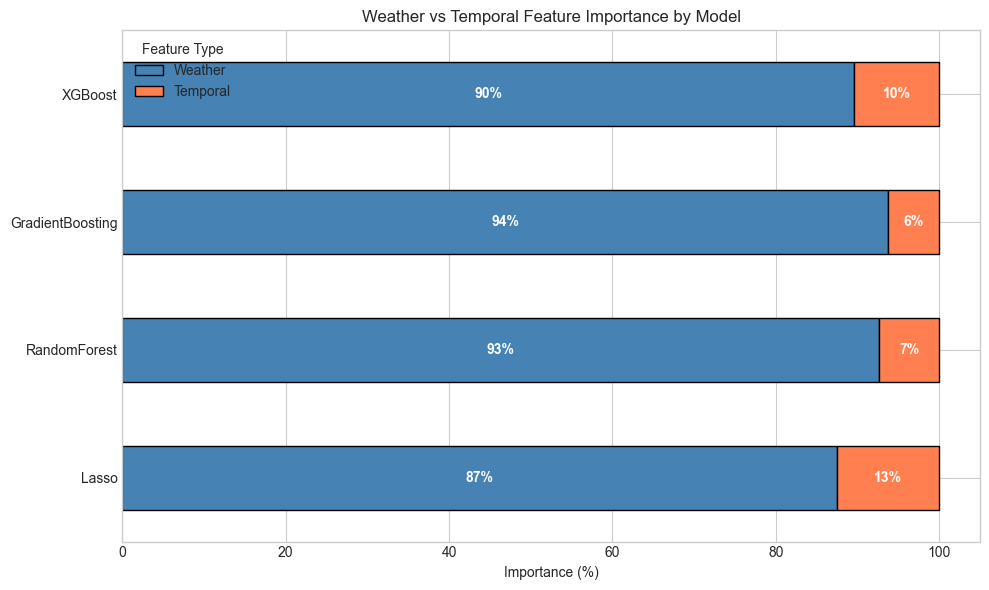

In [72]:
# Importance by feature TYPE for each model
type_importance = {}

for model_name in importance_df.drop(columns='AVG').columns:
    imp = importance_df[model_name]
    weather_imp = imp[[f for f in imp.index if f.startswith('ae_') or f.startswith('om_')]].sum()
    temporal_imp = imp[[f for f in imp.index if f in TEMPORAL_FEATURES]].sum()
    type_importance[model_name] = {'Weather': weather_imp * 100, 'Temporal': temporal_imp * 100}

type_df = pd.DataFrame(type_importance).T

print("="*60)
print("IMPORTANCE BY FEATURE TYPE (%)")
print("="*60)
print(type_df.round(1).to_string())

# Stacked bar chart
fig, ax = plt.subplots(figsize=(10, 6))
type_df.plot(kind='barh', stacked=True, ax=ax, color=['steelblue', 'coral'], edgecolor='black')
ax.set_xlabel('Importance (%)')
ax.set_title('Weather vs Temporal Feature Importance by Model')
ax.legend(title='Feature Type')

# Add percentage labels
for i, model in enumerate(type_df.index):
    weather = type_df.loc[model, 'Weather']
    temporal = type_df.loc[model, 'Temporal']
    ax.text(weather/2, i, f'{weather:.0f}%', ha='center', va='center', color='white', fontweight='bold')
    ax.text(weather + temporal/2, i, f'{temporal:.0f}%', ha='center', va='center', color='white', fontweight='bold')

plt.tight_layout()
plt.show()

In [73]:
# Linear models: Show coefficient direction (positive/negative effect)
linear_models = ['Lasso']
available_linear = [m for m in linear_models if m in models]

if available_linear:
    print("="*80)
    print("LINEAR MODEL COEFFICIENTS (direction of effect)")
    print("="*80)
    print("↑ = feature increase → crowd increase")
    print("↓ = feature increase → crowd decrease")
    print("-"*80)
    
    coef_df = pd.DataFrame()
    for model_name in available_linear:
        coef = pd.Series(models[model_name].coef_, index=feature_cols)
        coef_df[model_name] = coef
    
    # Sort by absolute average
    coef_df['AbsAvg'] = coef_df.abs().mean(axis=1)
    coef_df = coef_df.sort_values('AbsAvg', ascending=False).drop(columns='AbsAvg')
    
    # Show top features with direction
    print(f"\n{'Feature':<25}", end='')
    for m in available_linear:
        print(f"{m:>15}", end='')
    print()
    print("-"*80)
    
    for feat in coef_df.head(12).index:
        print(f"{feat:<25}", end='')
        for m in available_linear:
            val = coef_df.loc[feat, m]
            arrow = "↑" if val > 0 else "↓"
            print(f"{val:>12.2f} {arrow}", end='')
        print()

LINEAR MODEL COEFFICIENTS (direction of effect)
↑ = feature increase → crowd increase
↓ = feature increase → crowd decrease
--------------------------------------------------------------------------------

Feature                            Lasso
--------------------------------------------------------------------------------
om_pressure_msl                 42.66 ↑
ae_pres                        -26.43 ↓
ae_vv                           20.84 ↑
is_weekend                      17.38 ↑
ae_pres_nmar                   -15.84 ↓
om_wind_speed_10m              -10.78 ↓
om_wind_gusts_10m                6.01 ↑
om_dewpoint_2m                   3.78 ↑
ae_tamax                         2.57 ↑
hour_x_summer                   -1.70 ↓
om_cloud_cover_low              -1.64 ↓
om_apparent_temperature         -1.55 ↓


In [74]:
# Summary: Most important features across all models
print("="*70)
print("TOP 10 MOST IMPORTANT FEATURES (averaged across all models)")
print("="*70)

avg_importance = importance_df['AVG'].sort_values(ascending=False)

for i, (feat, imp) in enumerate(avg_importance.head(10).items(), 1):
    feat_type = 'Weather' if feat.startswith('ae_') or feat.startswith('om_') else 'Temporal'
    
    # Find which model values this feature most
    model_vals = importance_df.loc[feat].drop('AVG')
    top_model_name = model_vals.idxmax()
    top_model_val = model_vals.max() * 100
    
    print(f"{i:2d}. {feat:<25} ({feat_type:8s}) - Avg: {imp*100:5.1f}%  (highest: {top_model_name} {top_model_val:.0f}%)")

# Use average importance for later
importance = avg_importance

# Calculate global temporal_imp and weather_imp for insights summary
temporal_imp = importance[[f for f in importance.index if f in TEMPORAL_FEATURES]].sum()
weather_imp = importance[[f for f in importance.index if f.startswith('ae_') or f.startswith('om_')]].sum()

print(f"\n📊 Summary: Temporal {temporal_imp*100:.1f}% | Weather {weather_imp*100:.1f}%")

TOP 10 MOST IMPORTANT FEATURES (averaged across all models)
 1. om_wind_direction_10m     (Weather ) - Avg:  36.1%  (highest: XGBoost 50%)
 2. om_pressure_msl           (Weather ) - Avg:   8.6%  (highest: Lasso 27%)
 3. ae_pres                   (Weather ) - Avg:   6.3%  (highest: Lasso 17%)
 4. ae_hr                     (Weather ) - Avg:   5.7%  (highest: RandomForest 9%)
 5. ae_vv                     (Weather ) - Avg:   5.5%  (highest: Lasso 13%)
 6. om_wind_speed_10m         (Weather ) - Avg:   3.6%  (highest: Lasso 7%)
 7. ae_pres_nmar              (Weather ) - Avg:   3.1%  (highest: Lasso 10%)
 8. om_temperature_2m         (Weather ) - Avg:   2.9%  (highest: XGBoost 6%)
 9. ae_ta                     (Weather ) - Avg:   2.8%  (highest: RandomForest 4%)
10. ae_tamax                  (Weather ) - Avg:   2.8%  (highest: GradientBoosting 4%)

📊 Summary: Temporal 9.2% | Weather 90.8%


---
## 6. Validation & Predictions

In [75]:
# Select best model for final predictions
best_model_name = results_df.iloc[0]['Model']
best_model = models[best_model_name]
print(f"Best model: {best_model_name}")

# Predictions on test set
y_pred = best_model.predict(X_test)

Best model: LSTM


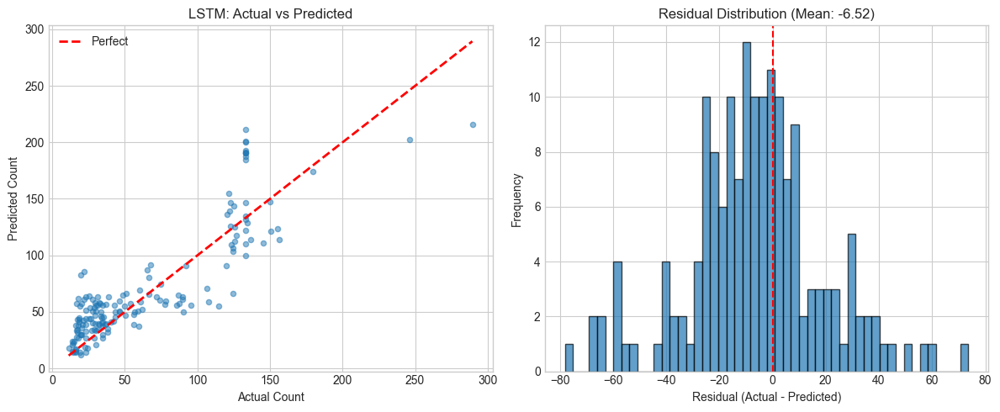

In [76]:
# Actual vs Predicted scatter
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot
axes[0].scatter(y_test, y_pred, alpha=0.5, s=20)
axes[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Perfect')
axes[0].set_xlabel('Actual Count')
axes[0].set_ylabel('Predicted Count')
axes[0].set_title(f'{best_model_name}: Actual vs Predicted')
axes[0].legend()

# Residuals
residuals = y_test.values - y_pred
axes[1].hist(residuals, bins=50, edgecolor='black', alpha=0.7)
axes[1].axvline(0, color='red', linestyle='--')
axes[1].set_xlabel('Residual (Actual - Predicted)')
axes[1].set_ylabel('Frequency')
axes[1].set_title(f'Residual Distribution (Mean: {residuals.mean():.2f})')

plt.tight_layout()
plt.show()

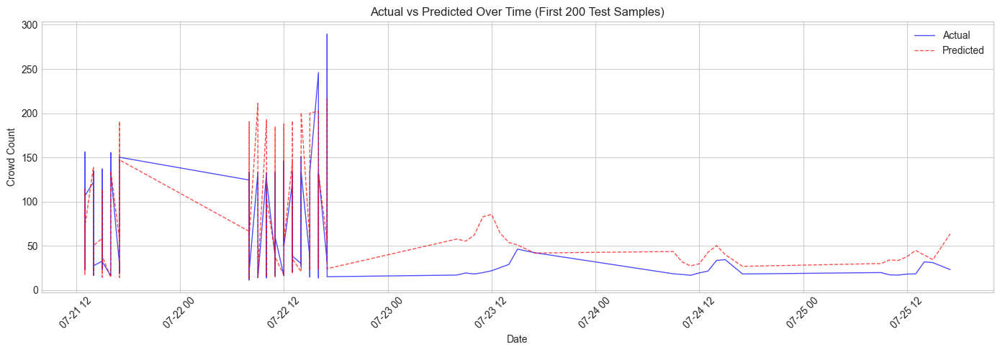

In [77]:
# Time series view of predictions
test_dates = df_clean.iloc[split_idx:]['datetime'].values

plt.figure(figsize=(14, 5))
plt.plot(test_dates[:200], y_test.values[:200], 'b-', alpha=0.7, label='Actual', linewidth=1)
plt.plot(test_dates[:200], y_pred[:200], 'r--', alpha=0.7, label='Predicted', linewidth=1)
plt.xlabel('Date')
plt.ylabel('Crowd Count')
plt.title('Actual vs Predicted Over Time (First 200 Test Samples)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Best model: LSTM


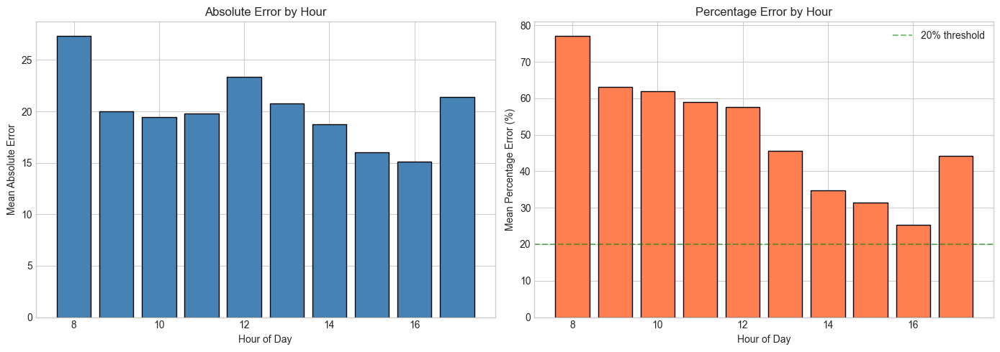

In [78]:
# Prediction errors by hour
test_df = df_clean.iloc[split_idx:].copy()
test_df['predicted'] = y_pred
test_df['error'] = test_df['count'] - test_df['predicted']
test_df['abs_error'] = test_df['error'].abs()
test_df['pct_error'] = (test_df['abs_error'] / (test_df['count'] + 1)) * 100  # Percentage error

error_by_hour = test_df.groupby('hour')['abs_error'].mean()
pct_error_by_hour = test_df.groupby('hour')['pct_error'].mean()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].bar(error_by_hour.index, error_by_hour.values, color='steelblue', edgecolor='black')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('Mean Absolute Error')
axes[0].set_title('Absolute Error by Hour')

axes[1].bar(pct_error_by_hour.index, pct_error_by_hour.values, color='coral', edgecolor='black')
axes[1].set_xlabel('Hour of Day')
axes[1].set_ylabel('Mean Percentage Error (%)')
axes[1].set_title('Percentage Error by Hour')
axes[1].axhline(20, color='green', linestyle='--', alpha=0.5, label='20% threshold')
axes[1].legend()
print(f"Best model: {best_model_name}")

plt.tight_layout()
plt.show()

### Per-Beach Validation (Normalized Metrics)

This is critical because:
- Beach A max 500 people: MAE=30 → 6% of capacity (good!)
- Beach B max 50 people: MAE=30 → 60% of capacity (terrible!)

MAX-based normalization gives fair comparison across beaches.

Best model: LSTM


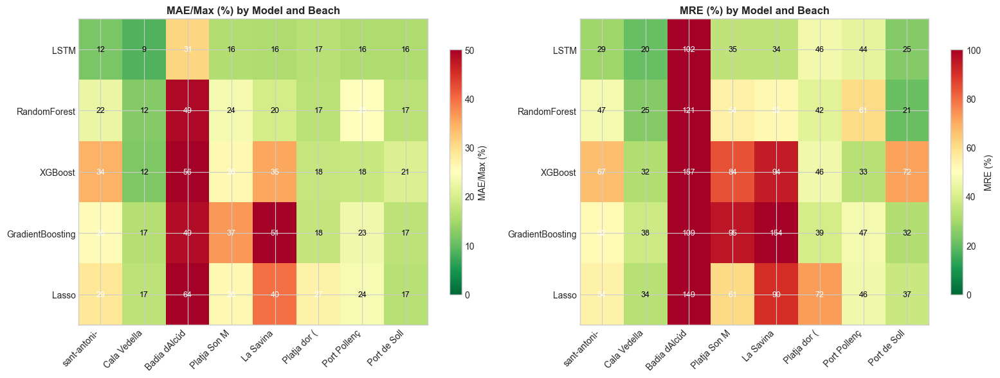

MODEL RANKING (sorted by Avg MAE/Max %)
           Model  Avg MAE/Max (%)  Avg MRE (%)     Best Beach    Worst Beach
            LSTM        16.467211    41.929111   Cala Vedella Badia dAlcúdia
    RandomForest        23.230770    53.009429   Cala Vedella Badia dAlcúdia
         XGBoost        27.593704    73.182041   Cala Vedella Badia dAlcúdia
GradientBoosting        29.527238    70.751366   Cala Vedella      La Savina
           Lasso        30.424094    67.953820 Port de Soller Badia dAlcúdia


In [79]:
# =============================================================================
# MODEL x BEACH COMPARISON: MAE/Max (%) and MRE (%)
# =============================================================================
beach_col = 'beach' if 'beach' in df_clean.columns else 'beach_folder'
beaches = df_clean.iloc[split_idx:][beach_col].unique()

# Calculate max for each beach (from full dataset for stability)
beach_max_dict = df_clean.groupby(beach_col)['count'].max().to_dict()

# Store results
mae_max_results = {}
mre_max_results = {}

for model_name, model in models.items():
    y_pred_all = model.predict(X_test)
    
    mae_max_results[model_name] = {}
    mre_max_results[model_name] = {}
    
    for beach in beaches:
        mask = df_clean.iloc[split_idx:][beach_col] == beach
        if mask.sum() < 3:
            continue
        
        y_true_b = y_test[mask].values
        y_pred_b = y_pred_all[mask]
        max_b = beach_max_dict.get(beach, np.max(y_true_b))
        
        if max_b > 0:
            mae = np.mean(np.abs(y_true_b - y_pred_b))
            max_err = np.max(np.abs(y_true_b - y_pred_b))
            mae_max_results[model_name][beach] = (mae / max_b) * 100
            mre_max_results[model_name][beach] = (max_err / max_b) * 100

# Create DataFrames
mae_df = pd.DataFrame(mae_max_results).T
mre_df = pd.DataFrame(mre_max_results).T

# Add average column
mae_df['AVG'] = mae_df.mean(axis=1)
mre_df['AVG'] = mre_df.mean(axis=1)

# Sort by average
mae_df = mae_df.sort_values('AVG')
mre_df = mre_df.loc[mae_df.index]

# =============================================================================
# VISUALIZATION: Heatmaps
# =============================================================================
fig, axes = plt.subplots(1, 2, figsize=(16, max(6, len(mae_df) * 0.6)))

# 1. MAE/Max heatmap
ax = axes[0]
mae_plot = mae_df.drop(columns='AVG')
im1 = ax.imshow(mae_plot.values, cmap='RdYlGn_r', aspect='auto', vmin=0, vmax=50)
ax.set_xticks(range(len(mae_plot.columns)))
ax.set_xticklabels([c[:12] for c in mae_plot.columns], rotation=45, ha='right')
ax.set_yticks(range(len(mae_plot.index)))
ax.set_yticklabels(mae_plot.index)
ax.set_title('MAE/Max (%) by Model and Beach', fontsize=12, fontweight='bold')
plt.colorbar(im1, ax=ax, label='MAE/Max (%)', shrink=0.8)

for i in range(len(mae_plot.index)):
    for j in range(len(mae_plot.columns)):
        val = mae_plot.iloc[i, j]
        color = 'white' if val > 25 else 'black'
        ax.text(j, i, f'{val:.0f}', ha='center', va='center', fontsize=9, color=color)

# 2. MRE heatmap
ax = axes[1]
mre_plot = mre_df.drop(columns='AVG')
im2 = ax.imshow(mre_plot.values, cmap='RdYlGn_r', aspect='auto', vmin=0, vmax=100)
ax.set_xticks(range(len(mre_plot.columns)))
ax.set_xticklabels([c[:12] for c in mre_plot.columns], rotation=45, ha='right')
ax.set_yticks(range(len(mre_plot.index)))
ax.set_yticklabels(mre_plot.index)
ax.set_title('MRE (%) by Model and Beach', fontsize=12, fontweight='bold')
plt.colorbar(im2, ax=ax, label='MRE (%)', shrink=0.8)
print(f"Best model: {best_model_name}")

for i in range(len(mre_plot.index)):
    for j in range(len(mre_plot.columns)):
        val = mre_plot.iloc[i, j]
        color = 'white' if val > 50 else 'black'
        ax.text(j, i, f'{val:.0f}', ha='center', va='center', fontsize=9, color=color)

plt.tight_layout()
plt.show()

# =============================================================================
# SUMMARY TABLE
# =============================================================================
print("="*100)
print("MODEL RANKING (sorted by Avg MAE/Max %)")
print("="*100)

summary = pd.DataFrame({
    'Model': mae_df.index,
    'Avg MAE/Max (%)': mae_df['AVG'].values,
    'Avg MRE (%)': mre_df['AVG'].values,
    'Best Beach': [mae_df.drop(columns='AVG').loc[m].idxmin() for m in mae_df.index],
    'Worst Beach': [mae_df.drop(columns='AVG').loc[m].idxmax() for m in mae_df.index],
})
print(summary.to_string(index=False))

In [81]:
# Summary: Best model per beach
print("="*70)
print("BEST MODEL PER BEACH (by MAE/Max %)")
print("="*70)

mae_no_avg = mae_df.drop(columns='AVG')
for beach in mae_no_avg.columns:
    best_m = mae_no_avg[beach].idxmin()
    best_v = mae_no_avg[beach].min()
    worst_m = mae_no_avg[beach].idxmax()
    worst_v = mae_no_avg[beach].max()
    max_count = beach_max_dict.get(beach, 0)
    print(f"\n{beach[:30]:30s} (max={max_count:.0f})")
    print(f"  Best:  {best_m:20s} → {best_v:5.1f}%")
    print(f"  Worst: {worst_m:20s} → {worst_v:5.1f}%")

print("\n" + "="*70)
print("OVERALL RANKING (by average MAE/Max %)")
print("="*70)
for i, (model, row) in enumerate(mae_df.iterrows(), 1):
    print(f"{i}. {model:20s} → Avg: {row['AVG']:5.1f}%")

BEST MODEL PER BEACH (by MAE/Max %)

sant-antoni-de-portmany        (max=84)
  Best:  LSTM                 →  11.6%
  Worst: XGBoost              →  34.5%

Cala Vedella                   (max=206)
  Best:  LSTM                 →   8.6%
  Worst: Lasso                →  17.3%

Badia dAlcúdia                 (max=63)
  Best:  LSTM                 →  31.0%
  Worst: Lasso                →  63.8%

Platja Son Maties              (max=82)
  Best:  LSTM                 →  16.1%
  Worst: GradientBoosting     →  36.6%

La Savina                      (max=30)
  Best:  LSTM                 →  15.9%
  Worst: GradientBoosting     →  50.7%

Platja dor (Can Pastilla)      (max=127)
  Best:  LSTM                 →  16.7%
  Worst: Lasso                →  27.1%

Port Pollença                  (max=133)
  Best:  LSTM                 →  15.9%
  Worst: RandomForest         →  25.1%

Port de Soller                 (max=317)
  Best:  LSTM                 →  15.9%
  Worst: XGBoost              →  20.6%

OVERALL

Best model: LSTM


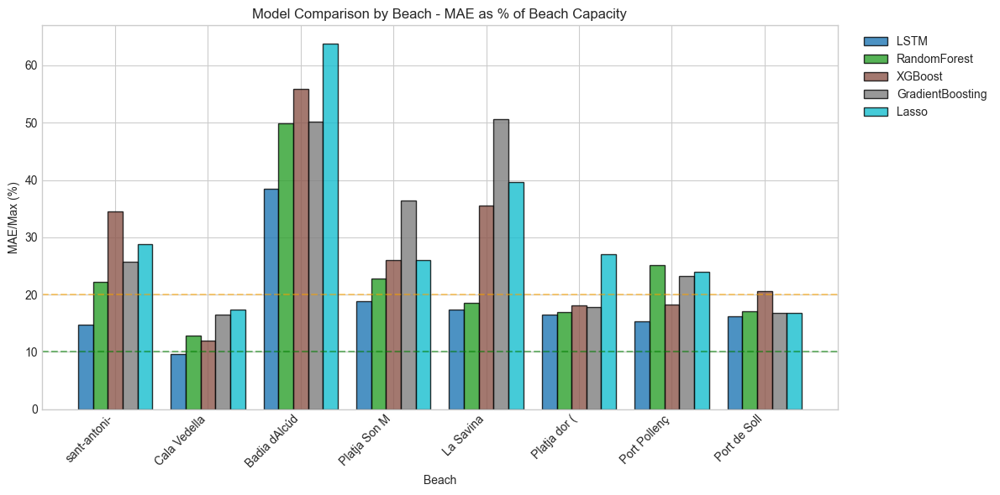

In [47]:
# Bar chart comparison
print(f"Best model: {best_model_name}")
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(len(mae_no_avg.columns))
width = 0.8 / len(mae_no_avg.index)
colors = plt.cm.tab10(np.linspace(0, 1, len(mae_no_avg.index)))

for i, (model, row) in enumerate(mae_no_avg.iterrows()):
    offset = (i - len(mae_no_avg.index)/2 + 0.5) * width
    ax.bar(x + offset, row.values, width, label=model, color=colors[i], edgecolor='black', alpha=0.8)

ax.set_xlabel('Beach')
ax.set_ylabel('MAE/Max (%)')
ax.set_title('Model Comparison by Beach - MAE as % of Beach Capacity')
ax.set_xticks(x)
ax.set_xticklabels([c[:12] for c in mae_no_avg.columns], rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
ax.axhline(10, color='green', linestyle='--', alpha=0.5, label='10% threshold')
ax.axhline(20, color='orange', linestyle='--', alpha=0.5, label='20% threshold')

plt.tight_layout()
plt.show()

### Per-Beach Validation (Best Model Only)

In [48]:
# =============================================================================
# PER-BEACH VALIDATION (Best Model)
# =============================================================================
print(f"Best model: {best_model_name}")

beach_col = 'beach' if 'beach' in test_df.columns else 'beach_folder'

beach_metrics = []
for beach in test_df[beach_col].unique():
    beach_data = test_df[test_df[beach_col] == beach]
    
    if len(beach_data) < 3:
        continue
    
    y_true_beach = beach_data['count'].values
    y_pred_beach = beach_data['predicted'].values
    max_beach = np.max(y_true_beach)
    
    metrics = calculate_beach_metrics(y_true_beach, y_pred_beach, max_beach)
    
    if metrics:
        beach_metrics.append({
            'Beach': beach[:30],
            'Samples': len(beach_data),
            'Max Count': max_beach,
            'MAE': round(metrics['MAE'], 1),
            'MAE/Max (%)': round(metrics['MAE/Max (%)'], 1),
            'MRE (%)': round(metrics['MRE (%)'], 1),
        })

beach_df = pd.DataFrame(beach_metrics).sort_values('MRE (%)')

print("="*100)
print("PER-BEACH VALIDATION (relative to each beach's max occupancy)")
print("="*100)
print(beach_df.to_string(index=False))

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Best beach:  {beach_df.iloc[0]['Beach']} (MRE: {beach_df.iloc[0]['MRE (%)']:.1f}%)")
print(f"Worst beach: {beach_df.iloc[-1]['Beach']} (MRE: {beach_df.iloc[-1]['MRE (%)']:.1f}%)")
print(f"Average MRE: {beach_df['MRE (%)'].mean():.1f}%")
print(f"Average MAE/Max: {beach_df['MAE/Max (%)'].mean():.1f}%")

Best model: LSTM
PER-BEACH VALIDATION (relative to each beach's max occupancy)
                    Beach  Samples  Max Count  MAE  MAE/Max (%)  MRE (%)
             Cala Vedella       15 179.311798 19.8         11.0     11.0
            Port Pollença       14 133.111740 20.4         15.3     15.3
  sant-antoni-de-portmany       15  74.708237 12.3         16.5     16.5
                La Savina       14  29.814447  5.2         17.4     17.4
           Port de Soller       14 289.411377 51.4         17.8     17.8
Platja dor (Can Pastilla)       29 114.610100 21.0         18.3     18.3
        Platja Son Maties       15  59.577362 15.4         25.9     25.9
           Badia dAlcúdia       51  46.217323 24.1         52.1     52.1

SUMMARY
Best beach:  Cala Vedella (MRE: 11.0%)
Worst beach: Badia dAlcúdia (MRE: 52.1%)
Average MRE: 21.8%
Average MAE/Max: 21.8%


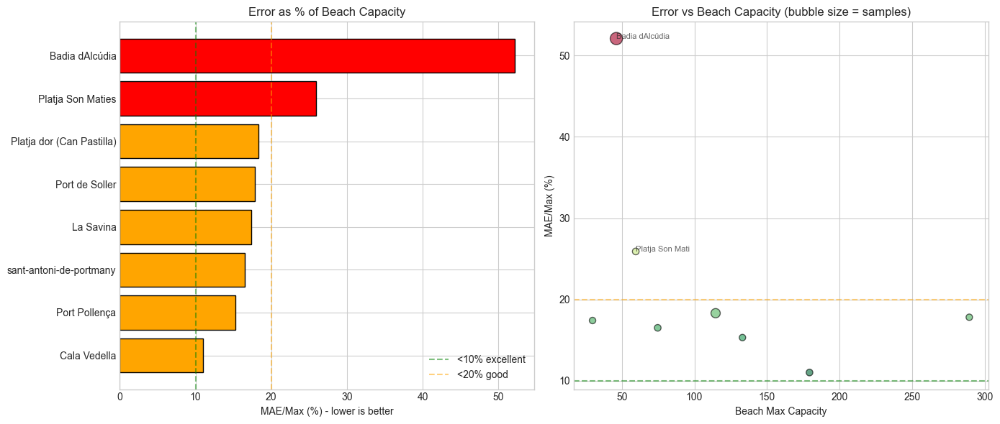

In [49]:
# Visualize per-beach performance
fig, axes = plt.subplots(1, 2, figsize=(14, max(6, len(beach_df) * 0.4)))

# 1. MAE/Max by beach
colors = ['green' if x < 10 else 'orange' if x < 20 else 'red' for x in beach_df['MAE/Max (%)']]
axes[0].barh(beach_df['Beach'], beach_df['MAE/Max (%)'], color=colors, edgecolor='black')
axes[0].set_xlabel('MAE/Max (%) - lower is better')
axes[0].set_title('Error as % of Beach Capacity')
axes[0].axvline(10, color='green', linestyle='--', alpha=0.5, label='<10% excellent')
axes[0].axvline(20, color='orange', linestyle='--', alpha=0.5, label='<20% good')
axes[0].legend()

# 2. Error vs beach capacity
scatter = axes[1].scatter(beach_df['Max Count'], beach_df['MAE/Max (%)'], 
                          s=beach_df['Samples']*3, alpha=0.6, 
                          c=beach_df['MAE/Max (%)'], cmap='RdYlGn_r', edgecolor='black')
axes[1].set_xlabel('Beach Max Capacity')
axes[1].set_ylabel('MAE/Max (%)')
axes[1].set_title('Error vs Beach Capacity (bubble size = samples)')
axes[1].axhline(10, color='green', linestyle='--', alpha=0.5)
axes[1].axhline(20, color='orange', linestyle='--', alpha=0.5)

for _, row in beach_df.iterrows():
    if row['MAE/Max (%)'] > 20 or row['MAE/Max (%)'] < 5:
        axes[1].annotate(row['Beach'][:15], (row['Max Count'], row['MAE/Max (%)']), 
                        fontsize=8, alpha=0.7)

plt.tight_layout()
plt.show()

In [50]:
# Show why max-based normalization matters
print("="*70)
print("WHY MAX-BASED NORMALIZATION MATTERS")
print("="*70)
print("\nCompare these two scenarios:")
print("\n  Beach A: max=500 people, MAE=25")
print(f"    → MAE/Max = {25/500*100:.1f}% ✓ Good!")
print("\n  Beach B: max=50 people, MAE=25")
print(f"    → MAE/Max = {25/50*100:.1f}% ✗ Bad!")
print("\nSame absolute error, very different meaning!")
print("\nMAE/Max tells you: 'How wrong am I relative to this beach's capacity?'")

WHY MAX-BASED NORMALIZATION MATTERS

Compare these two scenarios:

  Beach A: max=500 people, MAE=25
    → MAE/Max = 5.0% ✓ Good!

  Beach B: max=50 people, MAE=25
    → MAE/Max = 50.0% ✗ Bad!

Same absolute error, very different meaning!

MAE/Max tells you: 'How wrong am I relative to this beach's capacity?'


---
## 7. Forecasting Examples

In [51]:
def forecast(model, target_datetime, weather_data, feature_cols):
    """
    Make a single forecast using weather + temporal features only.
    
    Args:
        model: Trained model
        target_datetime: datetime object
        weather_data: Dict with weather features
        feature_cols: List of feature names model expects
    
    Returns:
        Predicted count
    """
    row = {'datetime': target_datetime}
    row.update(weather_data)
    
    df = pd.DataFrame([row])
    df = add_features(df)
    
    for f in feature_cols:
        if f not in df.columns:
            df[f] = 0.0
    
    pred = model.predict(df[feature_cols])
    return max(0, float(pred[0]))

In [52]:
# Example: Forecast for tomorrow
tomorrow = datetime.now() + timedelta(days=1)

scenarios = [
    {
        'name': 'Hot sunny morning (10am)',
        'datetime': tomorrow.replace(hour=10, minute=0, second=0),
        'weather': {'ae_ta': 30.0, 'om_temperature_2m': 29.0, 'om_cloud_cover': 0.0, 'ae_hr': 50.0}
    },
    {
        'name': 'Hot sunny afternoon (14pm)',
        'datetime': tomorrow.replace(hour=14, minute=0, second=0),
        'weather': {'ae_ta': 32.0, 'om_temperature_2m': 31.0, 'om_cloud_cover': 0.0, 'ae_hr': 45.0}
    },
    {
        'name': 'Cold cloudy morning (10am)',
        'datetime': tomorrow.replace(hour=10, minute=0, second=0),
        'weather': {'ae_ta': 15.0, 'om_temperature_2m': 14.0, 'om_cloud_cover': 90.0, 'ae_hr': 80.0}
    },
    {
        'name': 'Cold cloudy afternoon (14pm)',
        'datetime': tomorrow.replace(hour=14, minute=0, second=0),
        'weather': {'ae_ta': 16.0, 'om_temperature_2m': 15.0, 'om_cloud_cover': 85.0, 'ae_hr': 75.0}
    },
]

print(f"Forecasts for {tomorrow.strftime('%A, %B %d, %Y')}")
print("(Model uses weather + time only - no beach-specific info)")
print("=" * 60)

for scenario in scenarios:
    count = forecast(best_model, scenario['datetime'], scenario['weather'], feature_cols)
    print(f"\n{scenario['name']}:")
    print(f"  Time: {scenario['datetime'].strftime('%H:%M')}")
    print(f"  Temp: {scenario['weather'].get('ae_ta', 'N/A')}°C")
    print(f"  Cloud: {scenario['weather'].get('om_cloud_cover', 'N/A')}%")
    print(f"  → Predicted crowd: {count:.1f} people")

Forecasts for Tuesday, February 03, 2026
(Model uses weather + time only - no beach-specific info)

Hot sunny morning (10am):
  Time: 10:00
  Temp: 30.0°C
  Cloud: 0.0%
  → Predicted crowd: 36.3 people

Hot sunny afternoon (14pm):
  Time: 14:00
  Temp: 32.0°C
  Cloud: 0.0%
  → Predicted crowd: 36.2 people

Cold cloudy morning (10am):
  Time: 10:00
  Temp: 15.0°C
  Cloud: 90.0%
  → Predicted crowd: 36.3 people

Cold cloudy afternoon (14pm):
  Time: 14:00
  Temp: 16.0°C
  Cloud: 85.0%
  → Predicted crowd: 36.4 people


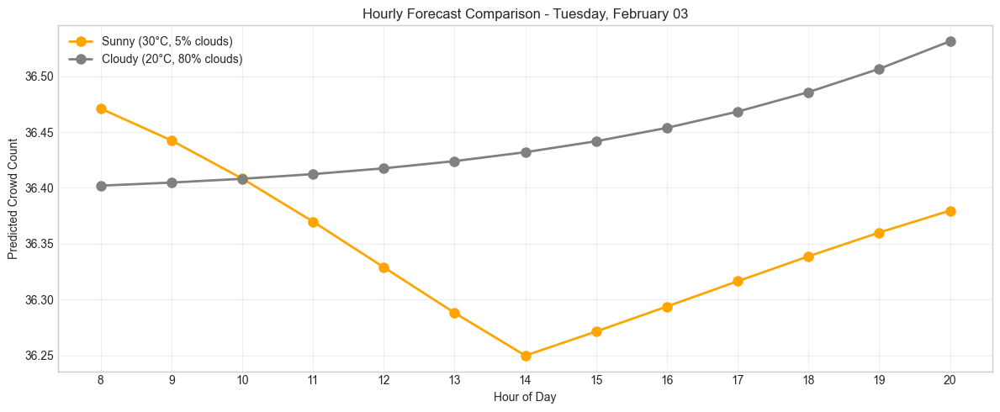


Sunny day peak: 36.5 people at 8:00
Cloudy day peak: 36.5 people at 20:00
Difference: -0.1 people


In [53]:
# Hourly forecast for a full day
def forecast_day(model, date, weather_by_hour, feature_cols):
    """Forecast for each hour of a day."""
    results = []
    for hour in range(8, 21):  # 8am to 8pm
        dt = date.replace(hour=hour, minute=0, second=0)
        weather = weather_by_hour.get(hour, {})
        count = forecast(model, dt, weather, feature_cols)
        results.append({'hour': hour, 'count': count, 'weather': weather})
    return results

# Simulate weather for a hot sunny day
sunny_weather = {}
for h in range(8, 21):
    temp = 22 + (h - 8) * 1.5 if h <= 14 else 31 - (h - 14) * 1.0
    sunny_weather[h] = {'ae_ta': temp, 'om_temperature_2m': temp - 1, 'om_cloud_cover': 5.0, 'ae_hr': 50.0}

# Simulate weather for a cloudy day
cloudy_weather = {}
for h in range(8, 21):
    temp = 18 + (h - 8) * 0.5
    cloudy_weather[h] = {'ae_ta': temp, 'om_temperature_2m': temp - 1, 'om_cloud_cover': 80.0, 'ae_hr': 75.0}

# Forecast both scenarios
sunny_forecast = forecast_day(best_model, tomorrow, sunny_weather, feature_cols)
cloudy_forecast = forecast_day(best_model, tomorrow, cloudy_weather, feature_cols)

# Plot
plt.figure(figsize=(12, 5))
hours = [f['hour'] for f in sunny_forecast]
sunny_counts = [f['count'] for f in sunny_forecast]
cloudy_counts = [f['count'] for f in cloudy_forecast]

plt.plot(hours, sunny_counts, 'o-', color='orange', linewidth=2, markersize=8, label='Sunny (30°C, 5% clouds)')
plt.plot(hours, cloudy_counts, 'o-', color='gray', linewidth=2, markersize=8, label='Cloudy (20°C, 80% clouds)')

plt.xlabel('Hour of Day')
plt.ylabel('Predicted Crowd Count')
plt.title(f'Hourly Forecast Comparison - {tomorrow.strftime("%A, %B %d")}')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xticks(hours)
plt.tight_layout()
plt.show()

print(f"\nSunny day peak: {max(sunny_counts):.1f} people at {hours[sunny_counts.index(max(sunny_counts))]}:00")
print(f"Cloudy day peak: {max(cloudy_counts):.1f} people at {hours[cloudy_counts.index(max(cloudy_counts))]}:00")
print(f"Difference: {max(sunny_counts) - max(cloudy_counts):.1f} people")

---
## 8. Save Best Model

In [54]:
# Save the best model
save_dir = Path(SAVE_DIR)
save_dir.mkdir(parents=True, exist_ok=True)

model_name = f"crowd_{best_model_name.lower()}_{datetime.now().strftime('%Y%m%d')}"
model_path = save_dir / f"{model_name}.pkl"

# Get feature importance if available
feature_importance = None
if hasattr(best_model, 'feature_importances_'):
    feature_importance = dict(zip(feature_cols, best_model.feature_importances_))
elif hasattr(best_model, 'coef_'):
    feature_importance = dict(zip(feature_cols, np.abs(best_model.coef_)))

# Save
save_data = {
    'model': best_model,
    'model_type': best_model_name,
    'features': feature_cols,
    'feature_importance': feature_importance,
    'metrics': {
        'test_rmse': float(results_df[results_df['Model'] == best_model_name]['Test RMSE'].values[0]),
        'test_mae': float(results_df[results_df['Model'] == best_model_name]['Test MAE'].values[0]),
        'test_r2': float(results_df[results_df['Model'] == best_model_name]['Test R²'].values[0])
    },
    'training_info': {
        'samples': len(X),
        'train_samples': len(X_train),
        'test_samples': len(X_test),
        'date_range': f"{df['datetime'].min()} to {df['datetime'].max()}"
    },
    'saved_at': datetime.now().isoformat()
}

with open(model_path, 'wb') as f:
    pickle.dump(save_data, f)

print(f"Model saved to: {model_path}")
print(f"\nModel Info:")
print(f"  Type: {best_model_name}")
print(f"  Features: {len(feature_cols)}")
print(f"  Test RMSE: {save_data['metrics']['test_rmse']:.2f}")
print(f"  Test R²: {save_data['metrics']['test_r2']:.3f}")

Model saved to: models/prediction/crowd_lstm_20260202.pkl

Model Info:
  Type: LSTM
  Features: 33
  Test RMSE: 29.69
  Test R²: 0.651


---
## 9. Insights Summary

In [55]:
print("="*60)
print("INSIGHTS SUMMARY")
print("="*60)

print(f"\n📊 DATASET:")
print(f"   • {len(df)} total records (daylight hours only: 8am-5pm)")
print(f"   • {df['beach'].nunique() if 'beach' in df.columns else df['beach_folder'].nunique()} beaches")
print(f"   • Date range: {df['datetime'].min().strftime('%Y-%m-%d')} to {df['datetime'].max().strftime('%Y-%m-%d')}")
print(f"   • Crowd range: {df['count'].min():.0f} to {df['count'].max():.0f} (mean: {df['count'].mean():.1f})")

print(f"\n🏆 BEST MODEL: {results_df.iloc[0]['Model']}")
print(f"   Metrics:")
print(f"   • Test MAE: {results_df.iloc[0]['Test MAE']:.2f}")
print(f"   • Test R²: {results_df.iloc[0]['Test R²']:.3f}")
print(f"   Per-beach relative metrics:")
print(f"   • Avg MRE: {results_df.iloc[0]['Avg MRE (%)']:.1f}%")
print(f"   • Avg MAE/Max: {results_df.iloc[0]['Avg MAE/Max (%)']:.1f}%")

print(f"\n🎯 INTERPRETATION (Avg MRE %):")
best_pct = results_df.iloc[0]['Avg MRE (%)']
if best_pct < 5:
    print(f"   • {best_pct:.1f}% = EXCELLENT - avg error within 5% of beach capacity")
elif best_pct < 10:
    print(f"   • {best_pct:.1f}% = GOOD - avg error within 10% of beach capacity")
elif best_pct < 20:
    print(f"   • {best_pct:.1f}% = ACCEPTABLE - avg error within 20% of beach capacity")
else:
    print(f"   • {best_pct:.1f}% = NEEDS IMPROVEMENT - avg error >20% of capacity")

print(f"\n🔑 FEATURE IMPORTANCE:")
print(f"   • Temporal features: {temporal_imp*100:.1f}%")
print(f"   • Weather features: {weather_imp*100:.1f}%")
print(f"   • Top 5: {', '.join(importance.head(5).index.tolist())}")

print(f"\n🏖️ PER-BEACH PERFORMANCE:")
print(f"   • Best: {beach_df.iloc[0]['Beach']} (MRE: {beach_df.iloc[0]['MRE (%)']:.1f}%)")
print(f"   • Worst: {beach_df.iloc[-1]['Beach']} (MRE: {beach_df.iloc[-1]['MRE (%)']:.1f}%)")
print(f"   • Average MRE: {beach_df['MRE (%)'].mean():.1f}%")
good_beaches = len(beach_df[beach_df['MRE (%)'] < 10])
print(f"   • Beaches with MRE < 10%: {good_beaches}/{len(beach_df)}")

print(f"\n📈 KEY PATTERNS:")
print(f"   • Peak hour: {hourly.idxmax()}:00 (avg {hourly.max():.1f} people)")
print(f"   • Quietest hour: {hourly.idxmin()}:00 (avg {hourly.min():.1f} people)")

if 'is_weekend' in df.columns and df['is_weekend'].nunique() > 1:
    weekend_avg = df[df['is_weekend'] == 1]['count'].mean()
    weekday_avg = df[df['is_weekend'] == 0]['count'].mean()
    print(f"   • Weekend avg: {weekend_avg:.1f} vs Weekday avg: {weekday_avg:.1f}")

print(f"\n💡 RECOMMENDATIONS:")
if temporal_imp > 0.7:
    print("   ⚠️ Model heavily relies on temporal features")
    print("   → Collect more diverse weather conditions")
if weather_imp < 0.2:
    print("   ⚠️ Weather has low importance")
    print("   → Need more weather variation in training data")
if best_pct > 20:
    print("   ⚠️ High error rate - model needs improvement")
    print("   → Consider more features or data collection")

INSIGHTS SUMMARY

📊 DATASET:
   • 850 total records (daylight hours only: 8am-5pm)
   • 10 beaches
   • Date range: 2022-07-14 to 2022-07-25
   • Crowd range: 4 to 317 (mean: 72.1)

🏆 BEST MODEL: LSTM
   Metrics:
   • Test MAE: 21.72
   • Test R²: 0.651
   Per-beach relative metrics:
   • Avg MRE: 21.8%
   • Avg MAE/Max: 21.8%

🎯 INTERPRETATION (Avg MRE %):
   • 21.8% = NEEDS IMPROVEMENT - avg error >20% of capacity

🔑 FEATURE IMPORTANCE:
   • Temporal features: 7.1%
   • Weather features: 92.9%
   • Top 5: om_wind_direction_10m, om_pressure_msl, ae_pres, ae_hr, ae_vv

🏖️ PER-BEACH PERFORMANCE:
   • Best: Cala Vedella (MRE: 11.0%)
   • Worst: Badia dAlcúdia (MRE: 52.1%)
   • Average MRE: 21.8%
   • Beaches with MRE < 10%: 0/8

📈 KEY PATTERNS:
   • Peak hour: 16:00 (avg 82.2 people)
   • Quietest hour: 9:00 (avg 49.5 people)
   • Weekend avg: 77.5 vs Weekday avg: 70.4

💡 RECOMMENDATIONS:
   ⚠️ High error rate - model needs improvement
   → Consider more features or data collection


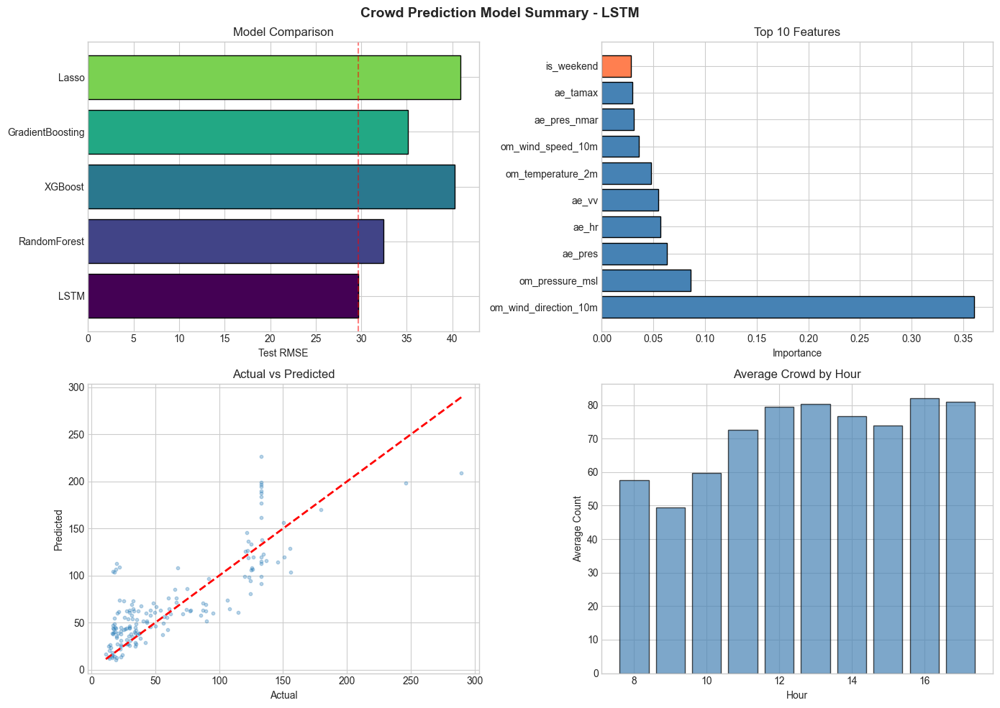


Summary figure saved to: models/prediction/crowd_lstm_20260202_summary.png


In [56]:
# Final visualization: Model comparison summary
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Model comparison
ax = axes[0, 0]
colors = plt.cm.viridis(np.linspace(0, 0.8, len(results_df)))
ax.barh(results_df['Model'], results_df['Test RMSE'], color=colors, edgecolor='black')
ax.set_xlabel('Test RMSE')
ax.set_title('Model Comparison')
ax.axvline(results_df['Test RMSE'].min(), color='red', linestyle='--', alpha=0.5)

# 2. Feature importance
ax = axes[0, 1]
top_imp = importance.head(10)
colors = ['steelblue' if f.startswith('ae_') or f.startswith('om_') else 'coral' for f in top_imp.index]
ax.barh(range(len(top_imp)), top_imp.values, color=colors, edgecolor='black')
ax.set_yticks(range(len(top_imp)))
ax.set_yticklabels(top_imp.index)
ax.set_xlabel('Importance')
ax.set_title('Top 10 Features')

# 3. Actual vs Predicted
ax = axes[1, 0]
ax.scatter(y_test, y_pred, alpha=0.3, s=10)
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title('Actual vs Predicted')

# 4. Hourly pattern
ax = axes[1, 1]
ax.bar(hourly.index, hourly.values, color='steelblue', edgecolor='black', alpha=0.7)
ax.set_xlabel('Hour')
ax.set_ylabel('Average Count')
ax.set_title('Average Crowd by Hour')

plt.suptitle(f'Crowd Prediction Model Summary - {best_model_name}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(save_dir / f'{model_name}_summary.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nSummary figure saved to: {save_dir / f'{model_name}_summary.png'}")